___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Clustering (Customer Segmentation) Project***". This is the last medium project of ***Machine Learning*** course.

At the end of this project, you will have performed ***Cluster Analysis*** with an ***Unsupervised Learning*** method.

---

In this project, customers are required to be segmented according to the purchasing history obtained from customer of a food delivery company.

This project is less challenging than other projects. After getting to know the data set quickly, you are expected to perform ***Exploratory Data Analysis***. You should observe the distribution of customers according to different variables, also discover relationships and correlations between variables. Then you will specify the different variables to use for cluster analysis.

The last step in customer segmentation is to group the customers into distinct clusters based on their characteristics and behaviors. One of the most common methods for clustering is ***K-Means Clustering***, which partitions the data into k clusters based on the distance to the cluster centroids. Other clustering methods include ***hierarchical clustering***, density-based clustering, and spectral clustering. Each cluster can be assigned a label that describes its main features and preferences.

- ***NOTE:*** *This project assumes that you already know the basics of coding in Python. You should also be familiar with the theory behind Cluster Analysis and scikit-learn module as well as Machine Learning before you begin.*

***Features:***
- AcceptedCmp1 - 1 if customer accepted the offer in the 1st campaign, 0 otherwise
- AcceptedCmp2 - 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
- AcceptedCmp3 - 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
- AcceptedCmp4 - 1 if customer accepted the offer in the 4th campaign, 0 otherwise
- AcceptedCmp5 - 1 if customer accepted the offer in the 5th campaign, 0 otherwise
- ***Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise*** 
- Complain - 1 if customer complained in the last 2 years
- DtCustomer - date of customer’s enrolment with the company
- Education - customer’s level of education
- Marital - customer’s marital status
- Kidhome - number of small children in customer’s household
- Teenhome - number of teenagers in customer’s household
- Income - customer’s yearly household income
- MntFishProducts - amount spent on fish products in the last 2 years
- MntMeatProducts - amount spent on meat products in the last 2 years
- MntFruits - amount spent on fruits products in the last 2 years
- MntSweetProducts - amount spent on sweet products in the last 2 years
- MntWines - amount spent on wine products in the last 2 years
- MntGoldProds - amount spent on gold products in the last 2 years
- NumDealsPurchases - number of purchases made with discount
- NumCatalogPurchases - number of purchases made using catalogue
- NumStorePurchases - number of purchases made directly in stores
- NumWebPurchases - number of purchases made through company’s web site
- NumWebVisitsMonth - number of visits to company’s web site in the last month
- Recency - number of days since the last purchase

#### 1. Import Libraries, Load Dataset, Exploring Data
- Import Libraries
- Load Dataset
- The First Look

#### 2. Exploratory Data Analysis (EDA)


#### 3. Cluster Analysis

- Clustering with numeric features

    * Create a new dataset with numeric features
    
    * Determine optimal number of clusters*
    
    * Apply K Means*
    
    * Visualizing and Labeling All the Clusters*
    
    
- Clustering based on selected features

    * Create a new dataset with variables of your choice*
    
    * Determine optimal number of clusters*
    
    * Apply K Means*
    
    * Visualizing and Labeling All the Clusters*
    
    
- Hierarchical Clustering with selected features

    * Determine optimal number of clusters using Dendogram*

    * Apply Agglomerative Clustering*

    * Visualizing and Labeling All the Clusters*

- Conclusion

---
---

## 1. Import Libraries, Load Dataset, Exploring Data

### Import Libraries

In [775]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
#import plotly.express as px

sns.set_style("whitegrid")

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

from sklearn.metrics import silhouette_score

#from ipywidgets import interact
import warnings

warnings.filterwarnings("ignore")

pd.options.display.float_format = (
    lambda x: "{:.0f}".format(x) if int(x) == x else "{:,.2f}".format(x)
)

### Load Dataset

In [776]:
df0 = pd.read_csv("marketing_campaign.csv", sep=";")
df = df0.copy()

### The First Look
- Since we will do clustering analysis, we will remove Response variable from dataset.
- You can rename columns to more usable, if you need.

In [777]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [778]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [779]:
df.sample(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
452,6471,1971,Master,Single,36230,1,0,2013-10-17,17,14,...,5,0,0,0,0,0,0,3,11,0
2202,11133,1973,PhD,YOLO,48432,0,1,2012-10-18,3,322,...,8,0,0,0,0,0,0,3,11,1
836,6141,1972,Master,Single,49494,1,0,2013-04-25,46,191,...,7,0,0,0,0,0,0,3,11,0
1039,5863,1953,Graduation,Married,47703,0,1,2013-05-29,95,359,...,5,0,0,0,0,0,0,3,11,0
1660,1165,1958,PhD,Single,50729,1,1,2013-05-02,62,239,...,6,0,0,0,0,0,0,3,11,0


In [780]:
df.duplicated().sum()

0

In [781]:
df.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [782]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240,"5,592.16","3,246.66",0,"2,828.25","5,458.50","8,427.75",11191
Year_Birth,2240,"1,968.81",11.98,1893,1959,1970,1977,1996
Income,2216,"52,247.25","25,173.08",1730,35303,"51,381.50",68522,666666
Kidhome,2240,0.44,0.54,0,0,0,1,2
Teenhome,2240,0.51,0.54,0,0,0,1,2
Recency,2240,49.11,28.96,0,24,49,74,99
MntWines,2240,303.94,336.60,0,23.75,173.50,504.25,1493
MntFruits,2240,26.30,39.77,0,1,8,33,199
MntMeatProducts,2240,166.95,225.72,0,16,67,232,1725
MntFishProducts,2240,37.53,54.63,0,3,12,50,259


In [783]:
df.describe(include="object").T

,count,unique,top,freq
Education,2240,5,Graduation,1127
Marital_Status,2240,8,Married,864
Dt_Customer,2240,663,2012-08-31,12


In [784]:
df.Marital_Status.value_counts() 

Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [785]:
df.Education.value_counts() 

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

In [786]:
def mapping_marital_status(x):
    if x in ["Married", "Together"]:
        return "together"
    elif x in ["Single", "Divorced","Widow","Absurd","YOLO", "Alone"]:
        return "single"

In [787]:
df.Marital_Status = df.Marital_Status.map(mapping_marital_status)

In [788]:
df.Marital_Status.value_counts() 

Marital_Status
together    1444
single       796
Name: count, dtype: int64

In [789]:
df.Education.value_counts() 

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

In [790]:
df["Education"] = df["Education"].replace({"2n Cycle": "Master"})  

In [791]:
df.Education.value_counts() 

Education
Graduation    1127
Master         573
PhD            486
Basic           54
Name: count, dtype: int64

In [792]:
df.Dt_Customer.max()

'2014-06-29'

In [793]:
df["Dt_Customer"] = pd.to_datetime(df.Dt_Customer)

In [794]:
# En son müşteri tarihini bulma
latest_date = df['Dt_Customer'].max()

# Her müşteri için geçen ay sayısını hesaplama
df['dt_days'] = (latest_date - df['Dt_Customer'])

df["dt_days"]

0      663 days
1      113 days
2      312 days
3      139 days
4      161 days
         ...   
2235   381 days
2236    19 days
2237   155 days
2238   156 days
2239   622 days
Name: dt_days, Length: 2240, dtype: timedelta64[ns]

In [795]:
df["dt_days"] = df["dt_days"].astype(str)

In [796]:
import re

In [797]:
df["dt_days"] = df["dt_days"].astype(str)

In [798]:
df["dt_days"] = df["dt_days"].apply(lambda x: re.search(r'\d+', x).group())

In [799]:
df["dt_days"] = df["dt_days"].astype(int)

In [800]:
df["dt_days"]

0       663
1       113
2       312
3       139
4       161
       ... 
2235    381
2236     19
2237    155
2238    156
2239    622
Name: dt_days, Length: 2240, dtype: int64

In [801]:
df.Z_CostContact.value_counts()  # sadece 1 tane unique değer oldugu için düşülecek

Z_CostContact
3    2240
Name: count, dtype: int64

In [802]:
df.Z_Revenue.value_counts()    # sadece 1 tane unique değer oldugu için düşülecek

Z_Revenue
11    2240
Name: count, dtype: int64

In [803]:
df.groupby(["Education", "Marital_Status"])[["Income"]].mean()

Income
Education  Marital_Status          
Basic      single         17,998.35
           together       21,663.85
Graduation single         52,615.57
           together       52,779.38
Master     single         52,759.89
           together       50,185.95
PhD        single         54,050.66
           together       57,343.24

In [804]:
df.groupby(["Education", "Marital_Status"])[["Income"]].median()

Income
Education  Marital_Status          
Basic      single             16383
           together           23179
Graduation single         52,372.50
           together       51,763.50
Master     single             49514
           together       49,611.50
PhD        single             52278
           together       57,004.50

In [805]:
df.Education.value_counts() 

Education
Graduation    1127
Master         573
PhD            486
Basic           54
Name: count, dtype: int64

In [806]:
df.Kidhome.value_counts() 

Kidhome
0    1293
1     899
2      48
Name: count, dtype: int64

In [807]:
df.Teenhome.value_counts() 

Teenhome
0    1158
1    1030
2      52
Name: count, dtype: int64

In [808]:
df["siblings"] = df["Kidhome"] + df["Teenhome"]

In [809]:
df["siblings"].value_counts()

siblings
1    1128
0     638
2     421
3      53
Name: count, dtype: int64

In [810]:
df.groupby(["Kidhome", "Teenhome"])[["siblings"]].value_counts()

Kidhome  Teenhome  siblings
0        0         0           638
         1         1           625
         2         2            30
1        0         1           503
         1         2           374
         2         3            22
2        0         2            17
         1         3            31
Name: count, dtype: int64

In [811]:
df["siblings"] = df["siblings"].replace({3:2})

In [812]:
df["siblings"].value_counts()

siblings
1    1128
0     638
2     474
Name: count, dtype: int64

In [813]:
df["family_s"] = df["siblings"] + df["Marital_Status"].replace({"single": 1, "together":2})

In [814]:
df["family_s"].value_counts()

family_s
3    910
2    764
4    312
1    254
Name: count, dtype: int64

In [815]:
df["family_s"] = df["family_s"].replace({5:4})

In [816]:
df["family_s"].value_counts()

family_s
3    910
2    764
4    312
1    254
Name: count, dtype: int64

In [817]:
df["age"] = 2014 - df["Year_Birth"]

In [818]:
df["age"]

0       57
1       60
2       49
3       30
4       33
        ..
2235    47
2236    68
2237    33
2238    58
2239    60
Name: age, Length: 2240, dtype: int64

In [819]:
df["spent"] = df["MntWines"] + df["MntFruits"] + df["MntMeatProducts"] + df["MntFishProducts"] + df["MntSweetProducts"] + df["MntGoldProds"]

In [820]:
df["spent"].value_counts()

spent
46      19
22      18
57      16
44      15
55      15
        ..
1345     1
764      1
368      1
292      1
843      1
Name: count, Length: 1054, dtype: int64

In [821]:
df.T

,0,1,2,3,4,5,6,7,8,9,...,2230,2231,2232,2233,2234,2235,2236,2237,2238,2239
ID,5524,2174,4141,6182,5324,7446,965,6177,4855,5899,...,7004,9817,8080,9432,8372,10870,4001,7270,8235,9405
Year_Birth,1957,1954,1965,1984,1981,1967,1971,1985,1974,1950,...,1984,1970,1986,1977,1974,1967,1946,1981,1956,1954
Education,Graduation,Graduation,Graduation,Graduation,PhD,Master,Graduation,PhD,PhD,PhD,...,Graduation,Master,Graduation,Graduation,Graduation,Graduation,PhD,Graduation,Master,PhD
Marital_Status,single,single,together,together,together,together,single,together,together,together,...,single,single,single,together,together,together,together,single,together,together
Income,58138,46344,71613,26646,58293,62513,55635,33454,30351,5648,...,11012,44802,26816,666666,34421,61223,64014,56981,69245,52869
Kidhome,0,1,0,1,1,0,0,1,1,1,...,1,0,0,1,1,0,2,0,0,1
Teenhome,0,1,0,0,0,1,1,0,0,1,...,0,0,0,0,0,1,1,0,1,1
Dt_Customer,2012-09-04 00:00:00,2014-03-08 00:00:00,2013-08-21 00:00:00,2014-02-10 00:00:00,2014-01-19 00:00:00,2013-09-09 00:00:00,2012-11-13 00:00:00,2013-05-08 00:00:00,2013-06-06 00:00:00,2014-03-13 00:00:00,...,2013-03-16 00:00:00,2012-08-21 00:00:00,2012-08-17 00:00:00,2013-06-02 00:00:00,2013-07-01 00:00:00,2013-06-13 00:00:00,2014-06-10 00:00:00,2014-01-25 00:00:00,2014-01-24 00:00:00,2012-10-15 00:00:00
Recency,58,38,26,26,94,16,34,32,19,68,...,82,71,50,23,81,46,56,91,8,40
MntWines,635,11,426,11,173,520,235,76,14,28,...,24,853,5,9,3,709,406,908,428,84


In [822]:
df["total_acceptedcmp"] = df["AcceptedCmp1"] + df["AcceptedCmp2"] + df["AcceptedCmp3"] + df["AcceptedCmp4"] + df["AcceptedCmp5"]

In [823]:
df["total_acceptedcmp"].value_counts() 

total_acceptedcmp
0    1777
1     325
2      83
3      44
4      11
Name: count, dtype: int64

In [824]:
df["total_acceptedcmp"] = df["total_acceptedcmp"].replace({3:2 , 4:2})

In [825]:
df["total_acceptedcmp"].value_counts() 

total_acceptedcmp
0    1777
1     325
2     138
Name: count, dtype: int64

In [826]:
df.drop(columns=["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5"], inplace=True)

In [827]:
df.Complain.value_counts()

Complain
0    2219
1      21
Name: count, dtype: int64

In [828]:
df.drop(columns=["Complain"], inplace=True)

In [829]:
df['NumTotalPurchases'] = df['NumWebPurchases'] + df['NumCatalogPurchases'] + df['NumStorePurchases'] + df['NumDealsPurchases']


In [830]:
df['NumTotalPurchases'].unique()

array([25,  6, 21,  8, 19, 22, 10,  2,  4, 16, 15,  5, 26,  9, 13, 12, 43,
       17, 20, 14, 27, 11, 18, 28,  7, 24, 29, 23, 32, 30, 37, 31, 33, 35,
       39,  1, 34,  0, 44])

In [831]:
df.drop(columns=["ID", "Year_Birth", "Dt_Customer","Z_CostContact", "Z_Revenue"], inplace=True)


In [832]:
df.sample(5).T

,1477,1538,1191,441,376
Education,PhD,PhD,Master,PhD,Graduation
Marital_Status,together,together,single,together,single
Income,59892,71969,67369,56223,22585
Kidhome,0,0,0,0,0
Teenhome,1,1,1,1,0
Recency,26,59,81,72,23
MntWines,73,1000,1298,77,3
MntFruits,0,0,0,28,9
MntMeatProducts,13,76,70,31,15
MntFishProducts,0,0,37,16,13


In [833]:
df['Income'] = df['Income'].fillna(
    df.groupby(["Education", "Marital_Status"])['Income'].transform(lambda x: x.mode()[0] if not x.mode().empty else np.nan)
    )

print(df['Income'].isnull().sum())

0


In [834]:
df.isnull().sum()

Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
Response               0
dt_days                0
siblings               0
family_s               0
age                    0
spent                  0
total_acceptedcmp      0
NumTotalPurchases      0
dtype: int64

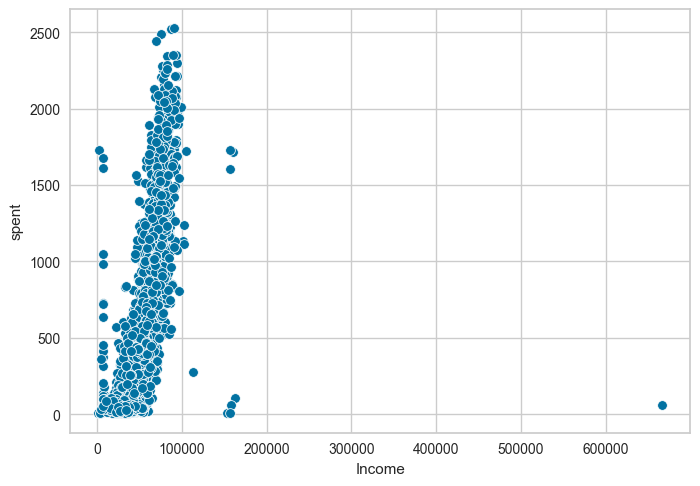

In [835]:
sns.scatterplot(data=df, x="Income", y="spent");

In [836]:
df.Income.max()

666666.0

In [837]:
df[df.Income == 666666].index

Index([2233], dtype='int64')

In [838]:
df.drop(index=[2233], inplace=True, axis=0)

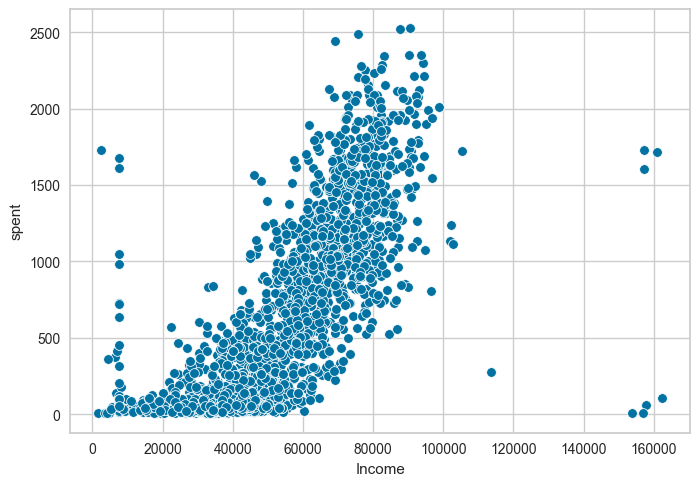

In [839]:
sns.scatterplot(data=df, x="Income", y="spent");

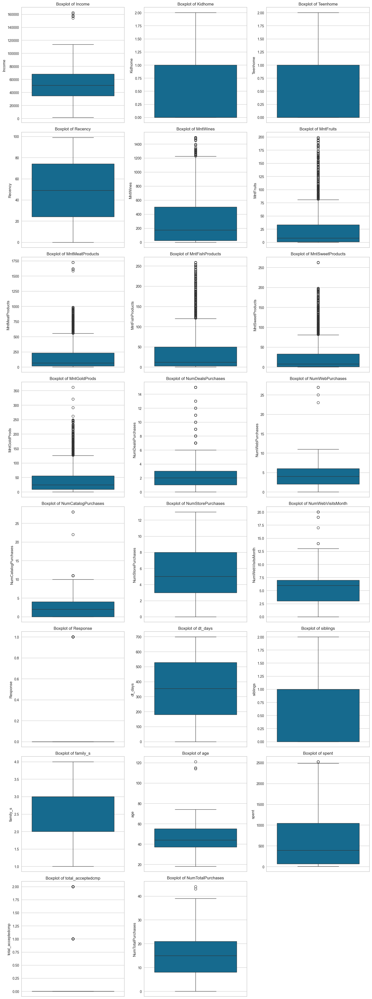

In [840]:
numeric_columns = df.select_dtypes(include=['number'])

ncols = 3
num_plots = len(numeric_columns.columns)
nrows = (num_plots - 1) // ncols + 1

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5 * nrows))

for i, column in enumerate(numeric_columns.columns):
    row = i // ncols
    col = i % ncols
    sns.boxplot(data=numeric_columns, y=column, ax=axes[row, col])
    axes[row, col].set_title(f'Boxplot of {column}')

for i in range(num_plots, nrows * ncols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

## 2. Exploratory Data Analysis (EDA)

After performing Cluster Analysis, you need to know the data well in order to label the observations correctly. Analyze frequency distributions of features, relationships and correlations between the independent variables and the dependent variable. It is recommended to apply data visualization techniques. Observing breakpoints helps you to internalize the data.

In [841]:
df_numeric0=df.select_dtypes(include ="number")
df_numeric0

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumStorePurchases,NumWebVisitsMonth,Response,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases
0,58138,0,0,58,635,88,546,172,88,88,...,4,7,1,663,0,1,57,1617,0,25
1,46344,1,1,38,11,1,6,2,1,6,...,2,5,0,113,2,3,60,27,0,6
2,71613,0,0,26,426,49,127,111,21,42,...,10,4,0,312,0,2,49,776,0,21
3,26646,1,0,26,11,4,20,10,3,5,...,4,6,0,139,1,3,30,53,0,8
4,58293,1,0,94,173,43,118,46,27,15,...,6,5,0,161,1,3,33,422,0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223,0,1,46,709,43,182,42,118,247,...,4,5,0,381,1,3,47,1341,0,18
2236,64014,2,1,56,406,0,30,0,0,8,...,5,7,0,19,2,4,68,444,1,22
2237,56981,0,0,91,908,48,217,32,12,24,...,13,6,0,155,0,1,33,1241,1,19
2238,69245,0,1,8,428,30,214,80,30,61,...,10,3,0,156,1,3,58,843,0,23


In [842]:
df_numeric_0 =df.select_dtypes(include ="number")
df_numeric = df_numeric_0.copy()

In [843]:
df_num = df_numeric_0
df_num 

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumStorePurchases,NumWebVisitsMonth,Response,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases
0,58138,0,0,58,635,88,546,172,88,88,...,4,7,1,663,0,1,57,1617,0,25
1,46344,1,1,38,11,1,6,2,1,6,...,2,5,0,113,2,3,60,27,0,6
2,71613,0,0,26,426,49,127,111,21,42,...,10,4,0,312,0,2,49,776,0,21
3,26646,1,0,26,11,4,20,10,3,5,...,4,6,0,139,1,3,30,53,0,8
4,58293,1,0,94,173,43,118,46,27,15,...,6,5,0,161,1,3,33,422,0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223,0,1,46,709,43,182,42,118,247,...,4,5,0,381,1,3,47,1341,0,18
2236,64014,2,1,56,406,0,30,0,0,8,...,5,7,0,19,2,4,68,444,1,22
2237,56981,0,0,91,908,48,217,32,12,24,...,13,6,0,155,0,1,33,1241,1,19
2238,69245,0,1,8,428,30,214,80,30,61,...,10,3,0,156,1,3,58,843,0,23


In [844]:
df_numeric = df_numeric.drop(["Response"], axis=1)

<Axes: >

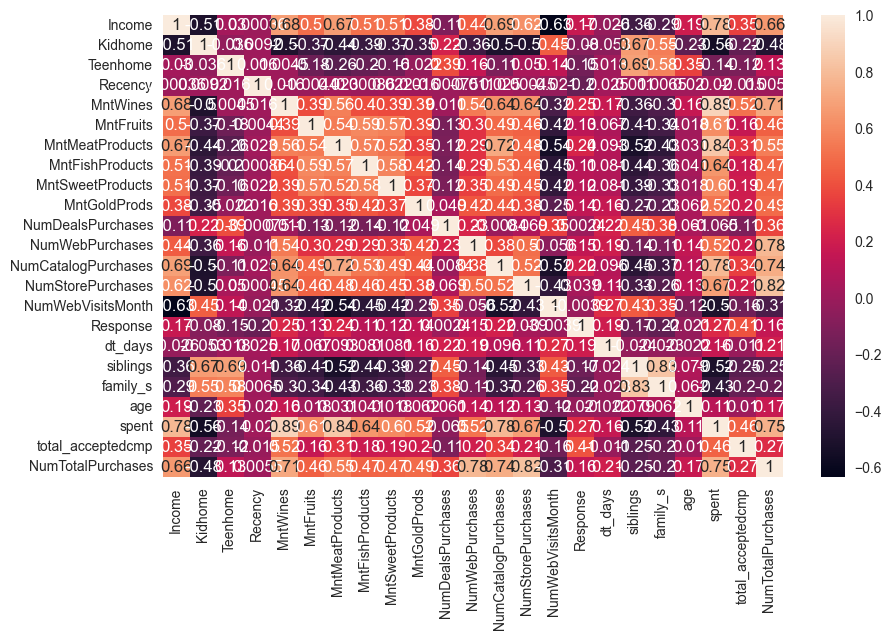

In [845]:
df_numeric = df.select_dtypes(include ="number")
plt.figure(figsize=(10,6))
sns.heatmap(df_numeric.corr(), annot =True)

### PCA
- We have too many features for bivariate analysis and pairplot. So we will create 3 components to have insight how our data distrubuted. 

In [846]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.pipeline import Pipeline

In [847]:
X_pca_scale = df_num.drop(["Response"], axis=1)
y_pca_scale = df["Response"]

In [848]:
scaler = StandardScaler()

In [849]:
scaled_X = scaler.fit_transform(X_pca_scale)

In [850]:
scaled_X

array([[ 0.30106461, -0.82476876, -0.93028167, ...,  1.67894446,
        -0.47477597,  1.32038124],
       [-0.2406728 ,  1.03303531,  0.9064914 , ..., -0.96163931,
        -0.47477597, -1.15462816],
       [ 0.92001591, -0.82476876, -0.93028167, ...,  0.28225833,
        -0.47477597,  0.79932663],
       ...,
       [ 0.24791978, -0.82476876, -0.93028167, ...,  1.05450453,
         1.29398177,  0.53879932],
       [ 0.81124584, -0.82476876,  0.9064914 , ...,  0.39352821,
        -0.47477597,  1.05985393],
       [ 0.05904202,  1.03303531,  0.9064914 , ..., -0.72083136,
        -0.47477597, -0.5033099 ]])

In [851]:
X_scaled_df = pd.DataFrame(scaled_X, columns=X_pca_scale.columns)

In [852]:
X_scaled_df

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases
0,0.30,-0.82,-0.93,0.31,0.98,1.55,1.68,2.46,1.48,0.84,...,2.51,-0.55,0.69,1.53,-1.32,-1.81,0.98,1.68,-0.47,1.32
1,-0.24,1.03,0.91,-0.38,-0.87,-0.64,-0.71,-0.65,-0.63,-0.73,...,-0.57,-1.17,-0.13,-1.19,1.53,0.49,1.24,-0.96,-0.47,-1.15
2,0.92,-0.82,-0.93,-0.80,0.36,0.57,-0.18,1.34,-0.15,-0.04,...,-0.23,1.29,-0.54,-0.21,-1.32,-0.66,0.32,0.28,-0.47,0.80
3,-1.15,1.03,-0.93,-0.80,-0.87,-0.56,-0.65,-0.50,-0.58,-0.75,...,-0.91,-0.55,0.28,-1.06,0.10,0.49,-1.27,-0.92,-0.47,-0.89
4,0.31,1.03,-0.93,1.55,-0.39,0.42,-0.22,0.15,-0.00,-0.56,...,0.12,0.06,-0.13,-0.95,0.10,0.49,-1.02,-0.31,-0.47,0.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,0.44,-0.82,0.91,-0.11,1.20,0.42,0.07,0.08,2.20,3.89,...,0.12,-0.55,-0.13,0.14,0.10,0.49,0.15,1.22,-0.47,0.41
2235,0.57,2.89,0.91,0.24,0.30,-0.66,-0.61,-0.69,-0.66,-0.69,...,-0.23,-0.24,0.69,-1.66,1.53,1.65,1.90,-0.27,1.29,0.93
2236,0.25,-0.82,-0.93,1.45,1.79,0.55,0.22,-0.10,-0.37,-0.38,...,0.12,2.22,0.28,-0.98,-1.32,-1.81,-1.02,1.05,1.29,0.54
2237,0.81,-0.82,0.91,-1.42,0.37,0.09,0.21,0.78,0.07,0.33,...,0.80,1.29,-0.95,-0.98,0.10,0.49,1.07,0.39,-0.47,1.06


<Axes: >

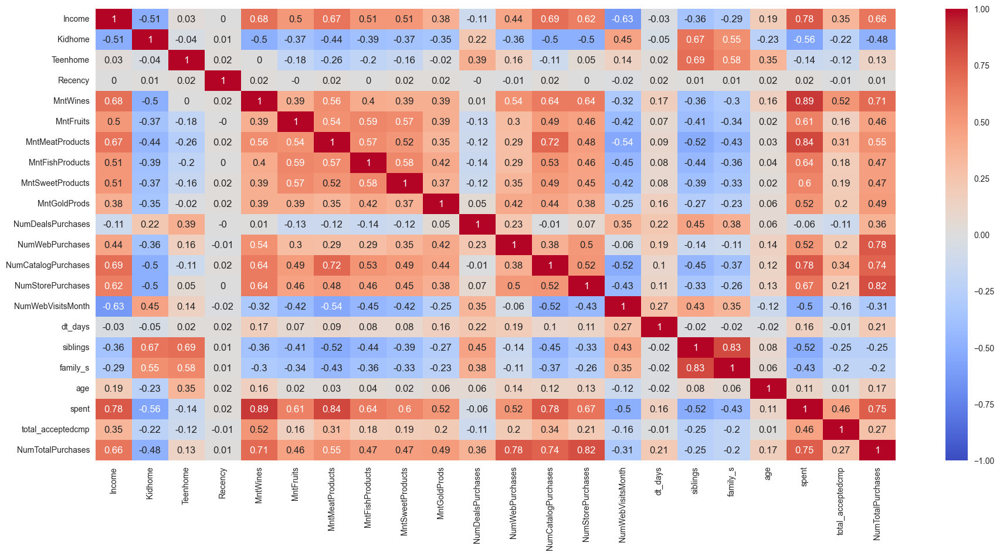

In [853]:
plt.figure(figsize=(22, 10))
sns.heatmap(X_scaled_df.corr().round(2), vmin=-1, vmax=1, annot=True, cmap="coolwarm")

In [854]:
pca = PCA(n_components=3)

In [855]:
principal_components = pca.fit_transform(scaled_X)

In [856]:
component_X = pd.DataFrame(data=principal_components,
                           columns=["first_component", "second_component", "third_component"])
component_X

,first_component,second_component,third_component
0,4.76,-0.15,2.05
1,-3.14,0.18,-2.13
2,2.31,-0.67,-0.02
3,-2.86,-1.41,0.28
4,-0.37,0.25,0.45
...,...,...,...
2234,2.58,1.63,0.40
2235,-1.65,3.77,-1.11
2236,2.46,-1.62,0.34
2237,1.93,1.25,-1.83


In [857]:
pca.components_

array([[ 0.27952798, -0.23453938, -0.06496113,  0.00377986,  0.26872621,
         0.23170519,  0.27528287,  0.24084417,  0.23119999,  0.1935795 ,
        -0.04350504,  0.19037755,  0.28071463,  0.25396529, -0.20959779,
         0.03965217, -0.21970475, -0.18824243,  0.04452561,  0.3231463 ,
         0.14411798,  0.27237235],
       [ 0.07386462,  0.05854638,  0.4541876 ,  0.01097944,  0.14645292,
        -0.05341939, -0.06877258, -0.06292378, -0.03685296,  0.09625466,
         0.42908699,  0.29165163,  0.04324361,  0.16245735,  0.16051887,
         0.15472912,  0.37474957,  0.3517658 ,  0.1938653 ,  0.05265157,
        -0.01166339,  0.29879864],
       [-0.2386244 ,  0.13339712, -0.33042109, -0.01804672,  0.02929025,
         0.02635245,  0.00263706,  0.02727334,  0.03116854,  0.14769283,
         0.23774223,  0.17430549, -0.03001661, -0.02711707,  0.43173519,
         0.53693192, -0.13822176, -0.14864601, -0.41788025,  0.03650494,
         0.01677448,  0.10000976]])

In [858]:
eigenvectors_first_component = pca.components_[0]
eigenvectors_first_component

array([ 0.27952798, -0.23453938, -0.06496113,  0.00377986,  0.26872621,
        0.23170519,  0.27528287,  0.24084417,  0.23119999,  0.1935795 ,
       -0.04350504,  0.19037755,  0.28071463,  0.25396529, -0.20959779,
        0.03965217, -0.21970475, -0.18824243,  0.04452561,  0.3231463 ,
        0.14411798,  0.27237235])

In [859]:
eigenvectors_second_component = pca.components_[1]
eigenvectors_second_component

array([ 0.07386462,  0.05854638,  0.4541876 ,  0.01097944,  0.14645292,
       -0.05341939, -0.06877258, -0.06292378, -0.03685296,  0.09625466,
        0.42908699,  0.29165163,  0.04324361,  0.16245735,  0.16051887,
        0.15472912,  0.37474957,  0.3517658 ,  0.1938653 ,  0.05265157,
       -0.01166339,  0.29879864])

In [860]:
eigenvectors_third_component = pca.components_[2]
eigenvectors_third_component

array([-0.2386244 ,  0.13339712, -0.33042109, -0.01804672,  0.02929025,
        0.02635245,  0.00263706,  0.02727334,  0.03116854,  0.14769283,
        0.23774223,  0.17430549, -0.03001661, -0.02711707,  0.43173519,
        0.53693192, -0.13822176, -0.14864601, -0.41788025,  0.03650494,
        0.01677448,  0.10000976])

In [861]:
X_scaled_df.loc[0]

Income                 0.30
Kidhome               -0.82
Teenhome              -0.93
Recency                0.31
MntWines               0.98
MntFruits              1.55
MntMeatProducts        1.68
MntFishProducts        2.46
MntSweetProducts       1.48
MntGoldProds           0.84
NumDealsPurchases      0.35
NumWebPurchases        1.41
NumCatalogPurchases    2.51
NumStorePurchases     -0.55
NumWebVisitsMonth      0.69
dt_days                1.53
siblings              -1.32
family_s              -1.81
age                    0.98
spent                  1.68
total_acceptedcmp     -0.47
NumTotalPurchases      1.32
Name: 0, dtype: float64

In [862]:
(X_scaled_df.loc[0] * eigenvectors_first_component).sum()

4.76482555683419

In [863]:
(X_scaled_df.loc[0] * eigenvectors_second_component).sum()

-0.1535127596125288

In [864]:
(X_scaled_df.loc[0] * eigenvectors_third_component).sum()

2.047776023541491

In [865]:
pca.explained_variance_ #Eigenvalues
# The explained_variance_ code shows us the eigenvalues that is
# how much information the relevant components carry on it.
# A component with a large value means it carries more information.

array([8.5568946 , 2.87230572, 1.49919719])

In [866]:
pca.explained_variance_ratio_

array([0.38877604, 0.13050104, 0.06811489])

In [867]:
pca.explained_variance_ratio_.cumsum()

array([0.38877604, 0.51927708, 0.58739197])

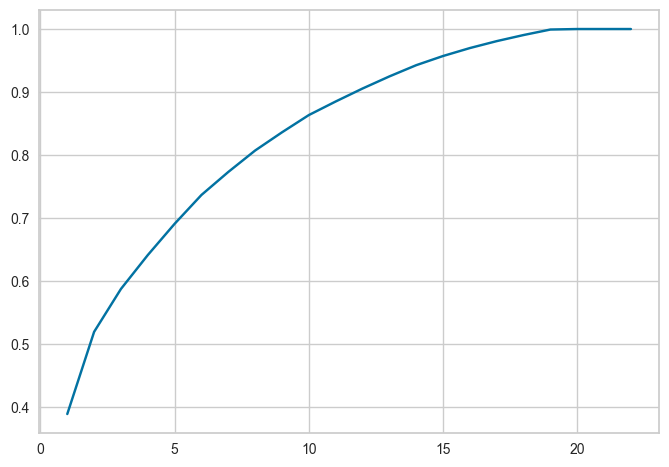

In [868]:
x = range(1,23)
pca = PCA().fit(scaled_X)
plt.plot(x, pca.explained_variance_ratio_.cumsum())

Yukarıdaki grafikte variance ratio nun cumulatif toplamlarını gösteren çizginin ivmesi sabit ve düzgün bir parabol çizdiği için PCA kullanmayı düşünmüyorum. 

In [869]:
pca = PCA(n_components=22).fit(scaled_X)

In [870]:
my_dict = {"explained_variance": pca.explained_variance_,
           "explained_variance_ratio": pca.explained_variance_ratio_,
           "cumsum_explained_variance_ratio": pca.explained_variance_ratio_.cumsum()}

In [871]:
df_ev = pd.DataFrame(my_dict, index=range(1,23))
df_ev
# we can see the explained_variance, explained_variance_ratio and cumulative sums of each component on a single df.

,explained_variance,explained_variance_ratio,cumsum_explained_variance_ratio
1,8.56,0.39,0.39
2,2.87,0.13,0.52
3,1.50,0.07,0.59
4,1.18,0.05,0.64
5,1.09,0.05,0.69
6,1.01,0.05,0.74
7,0.80,0.04,0.77
8,0.75,0.03,0.81
9,0.64,0.03,0.84
10,0.60,0.03,0.86


In [872]:
df_ev.explained_variance.sum()
# The sum of explained_variance of all components is always equal to the total number of features.

22.009830205540663

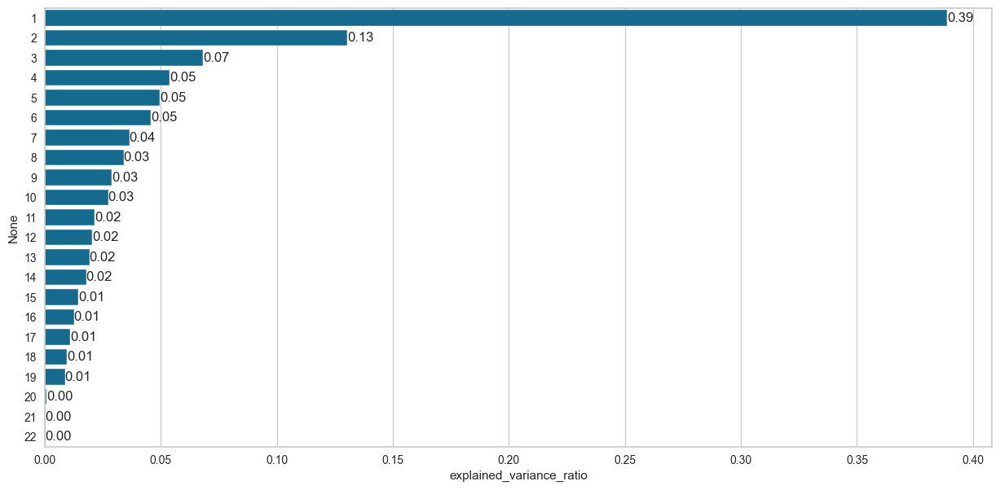

In [873]:
plt.figure(figsize=(15, 7))

ax = sns.barplot(y=df_ev.index,
                 x=df_ev.explained_variance_ratio,
                orient='horizontal')
ax.bar_label(ax.containers[0], fmt="%.2f");

# 3. Cluster Analysis

The purpose of the project is to perform cluster analysis using [K-Means](https://towardsdatascience.com/understanding-k-means-clustering-in-machine-learning-6a6e67336aa1) and [Hierarchical Clustering](https://medium.com/analytics-vidhya/hierarchical-clustering-d2d92835280c) algorithms.

The K-Means algorithm requires determining the number of clusters using the [Elbow Method](https://en.wikipedia.org/wiki/Elbow_method_(clustering), while Hierarchical Clustering builds a dendrogram without defining the number of clusters beforehand. Different labeling should be done based on the information obtained from each analysis.
Labeling example:

- **Normal Customers**  -- An Average consumer in terms of purchases and Income
- **Spender Customers** --  Income is less but purcheses high, so can also be treated as potential target customer.

## K-means Clsutering

### Create a new dataset with numeric features

In [874]:

scaler = StandardScaler()

In [875]:
km_df = df_numeric

In [876]:
scaled_X = scaler.fit_transform(km_df)

In [877]:
km_X1 = pd.DataFrame(scaled_X, columns=df_numeric.columns)
km_X1

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumStorePurchases,NumWebVisitsMonth,Response,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases
0,0.30,-0.82,-0.93,0.31,0.98,1.55,1.68,2.46,1.48,0.84,...,-0.55,0.69,2.39,1.53,-1.32,-1.81,0.98,1.68,-0.47,1.32
1,-0.24,1.03,0.91,-0.38,-0.87,-0.64,-0.71,-0.65,-0.63,-0.73,...,-1.17,-0.13,-0.42,-1.19,1.53,0.49,1.24,-0.96,-0.47,-1.15
2,0.92,-0.82,-0.93,-0.80,0.36,0.57,-0.18,1.34,-0.15,-0.04,...,1.29,-0.54,-0.42,-0.21,-1.32,-0.66,0.32,0.28,-0.47,0.80
3,-1.15,1.03,-0.93,-0.80,-0.87,-0.56,-0.65,-0.50,-0.58,-0.75,...,-0.55,0.28,-0.42,-1.06,0.10,0.49,-1.27,-0.92,-0.47,-0.89
4,0.31,1.03,-0.93,1.55,-0.39,0.42,-0.22,0.15,-0.00,-0.56,...,0.06,-0.13,-0.42,-0.95,0.10,0.49,-1.02,-0.31,-0.47,0.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,0.44,-0.82,0.91,-0.11,1.20,0.42,0.07,0.08,2.20,3.89,...,-0.55,-0.13,-0.42,0.14,0.10,0.49,0.15,1.22,-0.47,0.41
2235,0.57,2.89,0.91,0.24,0.30,-0.66,-0.61,-0.69,-0.66,-0.69,...,-0.24,0.69,-0.42,-1.66,1.53,1.65,1.90,-0.27,1.29,0.93
2236,0.25,-0.82,-0.93,1.45,1.79,0.55,0.22,-0.10,-0.37,-0.38,...,2.22,0.28,-0.42,-0.98,-1.32,-1.81,-1.02,1.05,1.29,0.54
2237,0.81,-0.82,0.91,-1.42,0.37,0.09,0.21,0.78,0.07,0.33,...,1.29,-0.95,-0.42,-0.98,0.10,0.49,1.07,0.39,-0.47,1.06


In [878]:
hopkins(scaled_X, 0.05)

0.8373141049954522

In [879]:
hopkins(scaled_X, 1)

0.8424723132445807

In [880]:
km_model = KMeans(random_state=42,)

In [881]:
km_model.fit(km_X1)

KMeans(random_state=42)

In [882]:
km_model.predict(km_X1)

array([1, 4, 7, ..., 5, 7, 4], dtype=int32)

In [883]:
km_model.fit_predict(km_X1)

array([1, 4, 7, ..., 5, 7, 4], dtype=int32)

In [884]:
km_model.labels_

array([1, 4, 7, ..., 5, 7, 4], dtype=int32)

In [885]:
# function to compute hopkins's statistic for the dataframe X
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
def hopkins(X, ratio=0.05):

    if not isinstance(X, np.ndarray):
      X=X.values  #convert dataframe to a numpy array
    sample_size = int(X.shape[0] * ratio) #0.05 (5%) based on paper by Lawson and Jures

    #a uniform random sample in the original data space
    X_uniform_random_sample = uniform(X.min(axis=0), X.max(axis=0) ,(sample_size , X.shape[1]))

    #a random sample of size sample_size from the original data X
    random_indices=sample(range(0, X.shape[0], 1), sample_size)
    X_sample = X[random_indices]

    #initialise unsupervised learner for implementing neighbor searches
    neigh = NearestNeighbors(n_neighbors=2)
    nbrs=neigh.fit(X)

    #u_distances = nearest neighbour distances from uniform random sample
    u_distances , u_indices = nbrs.kneighbors(X_uniform_random_sample , n_neighbors=2)
    u_distances = u_distances[: , 0] #distance to the first (nearest) neighbour

    #w_distances = nearest neighbour distances from a sample of points from original data X
    w_distances , w_indices = nbrs.kneighbors(X_sample , n_neighbors=2)
    #distance to the second nearest neighbour (as the first neighbour will be the point itself, with distance = 0)
    w_distances = w_distances[: , 1]

    u_sum = np.sum(u_distances)
    w_sum = np.sum(w_distances)

    #compute and return hopkins' statistic
    H = u_sum/ (u_sum + w_sum)
    return H

#### Determine optimal number of clusters

### inertia

In [886]:
def elbow_vis(X, k_range=range(2, 11), inertia=True):
    """
    This is a function that visualizes the elbow method for determining the optimal number of clusters in a dataset.

    Args:
        X (pd.Dataframe): Input data
        k_range (range, optional): generator for k values. Defaults to range(2, 11).
        inertia (bool, optional): to select either inertia or distorion. Defaults to True.
    Returns:
        None.
    """
    if inertia:
        inertias = []
        for k in k_range:
            kmeanModel = KMeans(n_clusters=k, random_state=42).fit(X)
            inertias.append(kmeanModel.inertia_)
        plt.figure(figsize=(10, 6))
        plt.plot(k_range, inertias, "bo--")
        plt.xlabel("k")
        plt.ylabel("Inertia")
        plt.title("The Elbow Method showing the optimal k")
        plt.show()
    else:
        distortion = []
        for k in k_range:
            kmeanModel = KMeans(n_clusters=k, random_state=42)
            kmeanModel.fit(X)
            distances = kmeanModel.transform(
                X
            )  # distances from each observation to each cluster centroid
            labels = kmeanModel.labels_
            result = []
            for i in range(k):
                cluster_distances = distances[
                    labels == i, i
                ]  # distances from observations in each cluster to their own centroid
                result.append(
                    np.mean(cluster_distances**2)
                )  # calculate the mean of squared distances from observations in each cluster to their own centroid and add it to the result list
            distortion.append(
                sum(result)
            )  # sum the means of all clusters and add it to the distortion list

        plt.figure(figsize=(10, 6))
        plt.plot(k_range, distortion, "r*--", markersize=14.0)
        plt.xlabel("Different k values")
        plt.ylabel("Distortion")
        plt.title("elbow method")

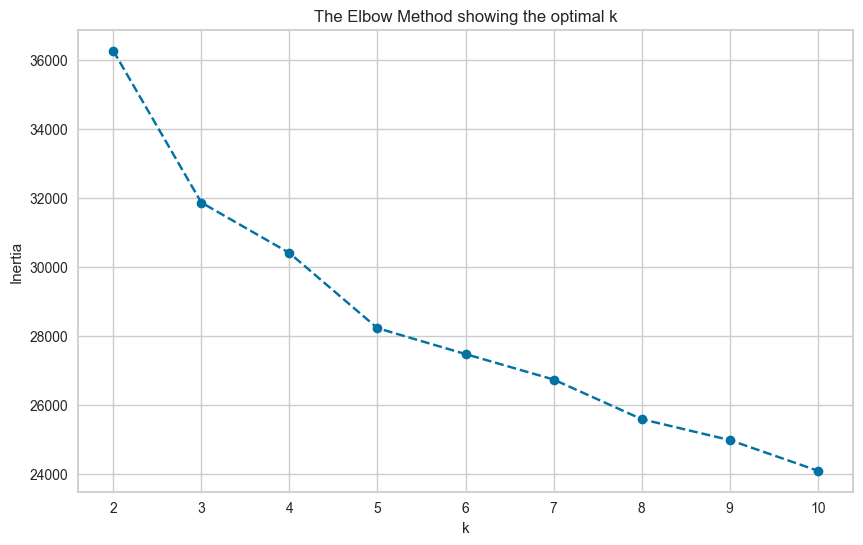

In [887]:
elbow_vis(scaled_X)

### distortion

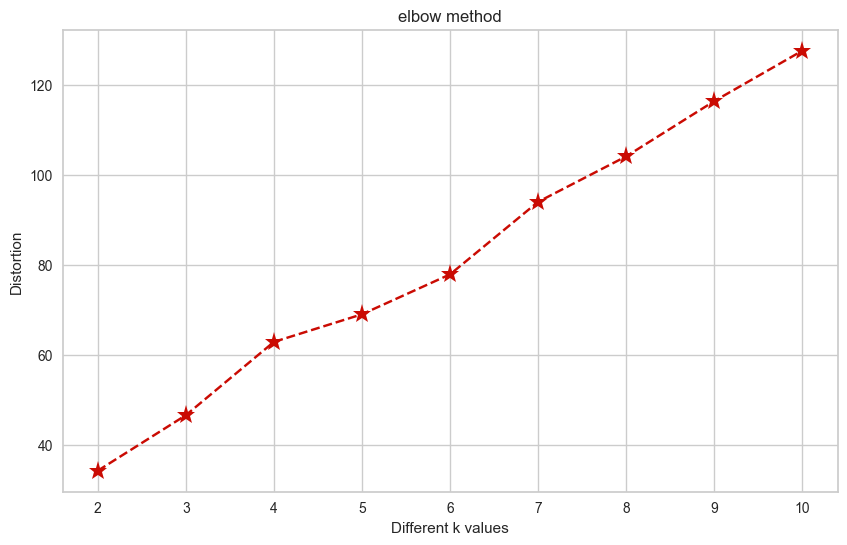

In [888]:
elbow_vis(scaled_X, inertia=False)

### silhoutte score

In [889]:
from sklearn.metrics import silhouette_score

In [890]:
km_model.labels_

array([1, 4, 7, ..., 5, 7, 4], dtype=int32)

In [891]:
silhouette_score(scaled_X, km_model.labels_)

0.142728785884598

In [892]:
range_n_clusters = range(2,9)
for num_clusters in range_n_clusters:
    # intialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X)
    cluster_labels = kmeans.labels_
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.28790953754904475
For n_clusters=3, the silhouette score is 0.2233237264531958
For n_clusters=4, the silhouette score is 0.20762751534561785
For n_clusters=5, the silhouette score is 0.15019260438562038
For n_clusters=6, the silhouette score is 0.15136447868047503
For n_clusters=7, the silhouette score is 0.1476145535531524
For n_clusters=8, the silhouette score is 0.142728785884598


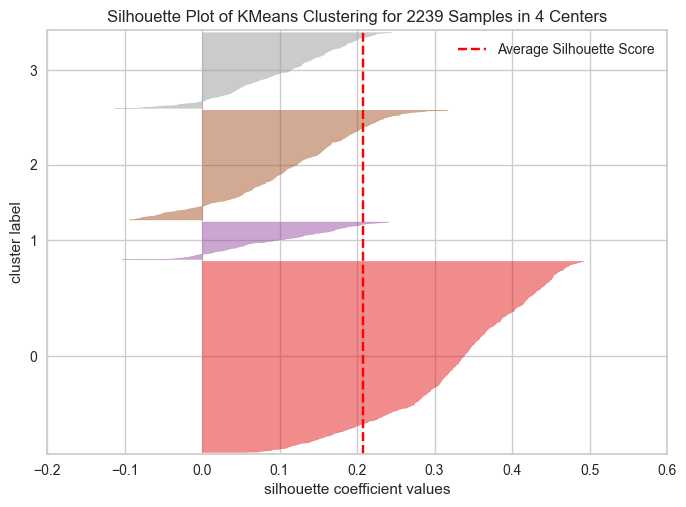

In [893]:
from sklearn.cluster import KMeans

from yellowbrick.cluster import SilhouetteVisualizer

model3 = KMeans(n_clusters=4,
                random_state=42)          # we decided n_clusters=3!
visualizer = SilhouetteVisualizer(model3)

visualizer.fit(scaled_X)    # Fit the data to the visualizer
visualizer.poof();

# With this feature of yellowbrick, we can see the silhouette scores of each cluster separately.

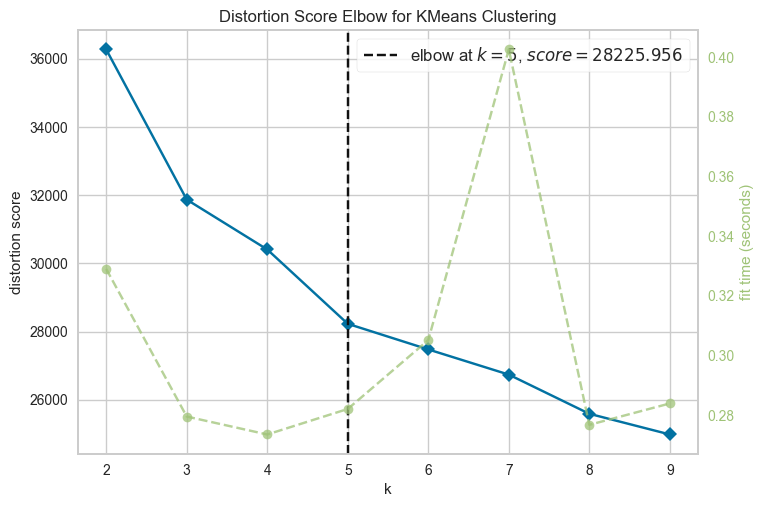

In [894]:
from yellowbrick.cluster import KElbowVisualizer

model_ = KMeans(random_state=42)
visualizer = KElbowVisualizer(model_, k=(2,10))

visualizer.fit(scaled_X)        # Fit the data to the visualizer
visualizer.show();

#### Apply K Means

In [895]:
final_model = KMeans(n_clusters=5,
                     random_state=42)
final_model.fit_predict(scaled_X)

array([1, 4, 3, ..., 3, 2, 4], dtype=int32)

In [896]:
final_model.labels_

array([1, 4, 3, ..., 3, 2, 4], dtype=int32)

In [897]:
km_X1["predicted_clusters"] = final_model.labels_

#### Visualizing and Labeling All the Clusters

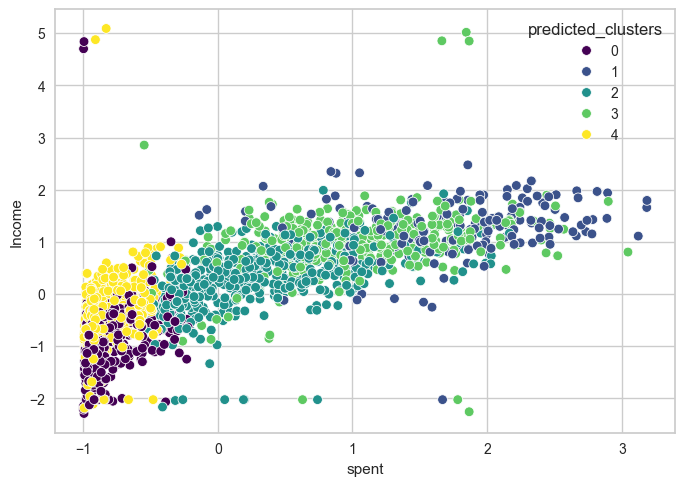

In [898]:
sns.scatterplot(data=km_X1, x="spent", y="Income", hue="predicted_clusters",  palette = 'viridis');

### Clustering based on selected features

#### Select features from existing data

In [899]:
clus_pred = km_X1.groupby("predicted_clusters").mean().T
clus_pred

predicted_clusters,0,1,2,3,4
Income,-0.98,1.29,0.32,0.98,-0.43
Kidhome,0.57,-0.76,-0.44,-0.75,0.67
Teenhome,-0.88,-0.80,0.84,-0.61,0.94
Recency,-0.02,-0.15,-0.04,0.10,0.04
MntWines,-0.80,1.66,0.58,0.53,-0.70
MntFruits,-0.50,0.86,-0.06,1.12,-0.56
MntMeatProducts,-0.62,1.48,-0.08,1.15,-0.63
MntFishProducts,-0.50,0.87,-0.11,1.22,-0.58
MntSweetProducts,-0.49,1.00,-0.04,1.03,-0.56
MntGoldProds,-0.50,0.54,0.42,0.65,-0.57


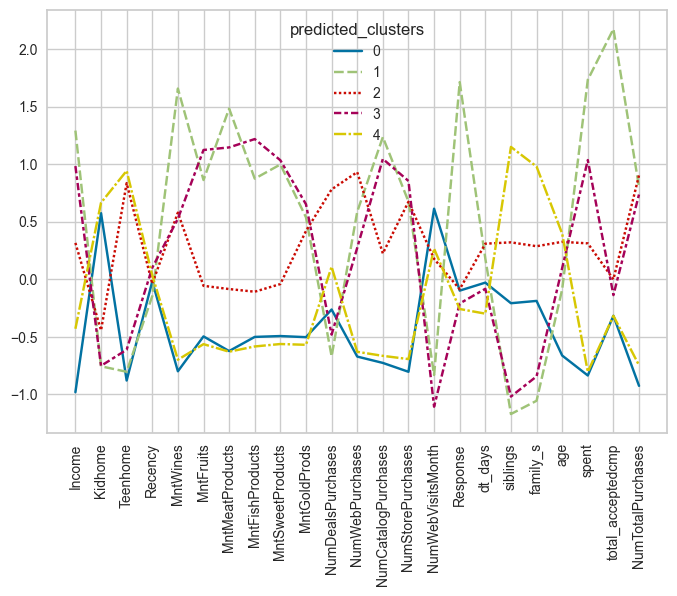

In [900]:
sns.lineplot(data = clus_pred)
plt.xticks(rotation=90)
plt.show()

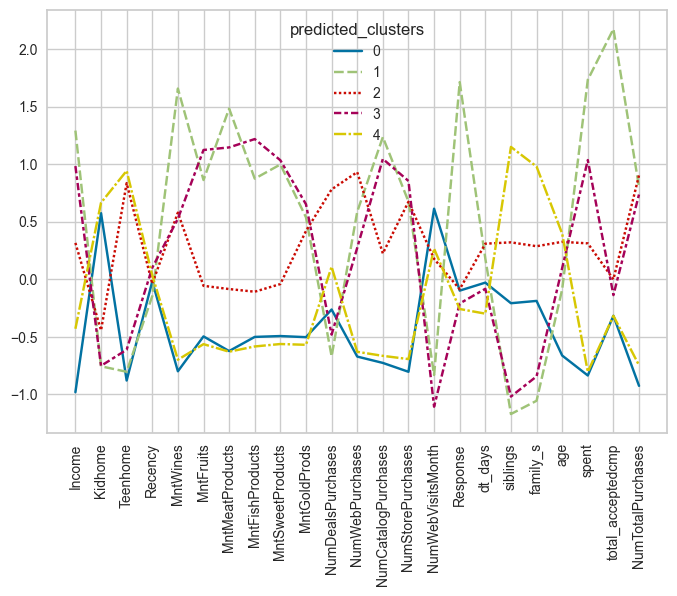

In [901]:
sns.lineplot(data = clus_pred)
plt.xticks(rotation=90)
plt.show()

#### Determine optimal number of clusters for selected features

#### Building the model based on the optimal number of clusters with selected features

In [902]:
df2 = df[['Income', 'MntWines', 'MntMeatProducts', 'MntFishProducts',  'MntSweetProducts', 'MntGoldProds', 'dt_days', 'spent', 'age']]
df2

,Income,MntWines,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,dt_days,spent,age
0,58138,635,546,172,88,88,663,1617,57
1,46344,11,6,2,1,6,113,27,60
2,71613,426,127,111,21,42,312,776,49
3,26646,11,20,10,3,5,139,53,30
4,58293,173,118,46,27,15,161,422,33
...,...,...,...,...,...,...,...,...,...
2235,61223,709,182,42,118,247,381,1341,47
2236,64014,406,30,0,0,8,19,444,68
2237,56981,908,217,32,12,24,155,1241,33
2238,69245,428,214,80,30,61,156,843,58


In [903]:
scaled_df2 = scaler.fit_transform(df2)
scaled_df2

array([[ 0.30106461,  0.98333899,  1.679196  , ...,  1.53094037,
         1.67894446,  0.98492226],
       [-0.2406728 , -0.87082589, -0.71343033, ..., -1.19020352,
        -0.96163931,  1.23528074],
       [ 0.92001591,  0.36231261, -0.1773048 , ..., -0.20564419,
         0.28225833,  0.31729965],
       ...,
       [ 0.24791978,  1.79453612,  0.22146626, ..., -0.98240708,
         1.05450453, -1.01794557],
       [ 0.81124584,  0.36825545,  0.20817389, ..., -0.97745955,
         0.39352821,  1.06837508],
       [ 0.05904202, -0.65391237, -0.46973691, ...,  1.32809146,
        -0.72083136,  1.23528074]])

In [904]:
scaled_X1 = pd.DataFrame(scaled_df2, columns = df2.columns)
scaled_X1.head()

,Income,MntWines,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,dt_days,spent,age
0,0.30,0.98,1.68,2.46,1.48,0.84,1.53,1.68,0.98
1,-0.24,-0.87,-0.71,-0.65,-0.63,-0.73,-1.19,-0.96,1.24
2,0.92,0.36,-0.18,1.34,-0.15,-0.04,-0.21,0.28,0.32
3,-1.15,-0.87,-0.65,-0.50,-0.58,-0.75,-1.06,-0.92,-1.27
4,0.31,-0.39,-0.22,0.15,-0.00,-0.56,-0.95,-0.31,-1.02


In [905]:
hopkins(scaled_X1, 0.05)

0.8726426220014117

In [906]:
hopkins(scaled_X1, 1)

0.8670768558138535

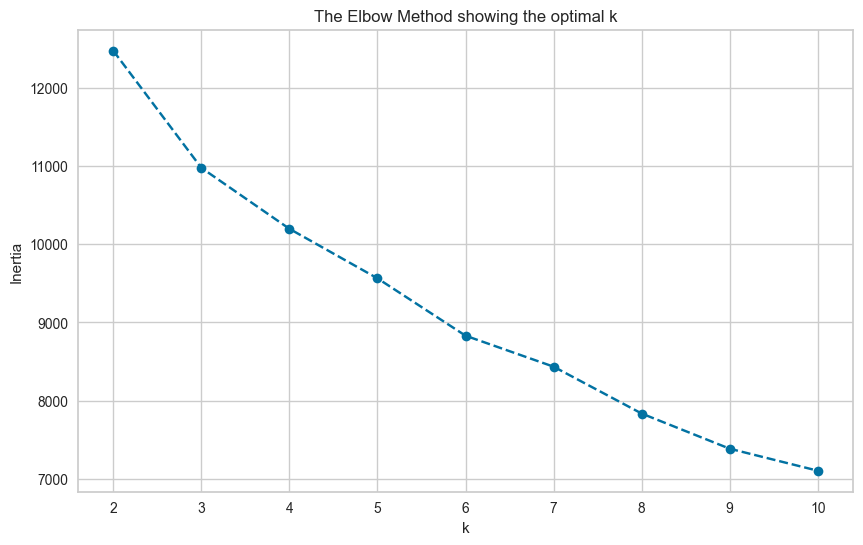

In [907]:
elbow_vis(scaled_X1)

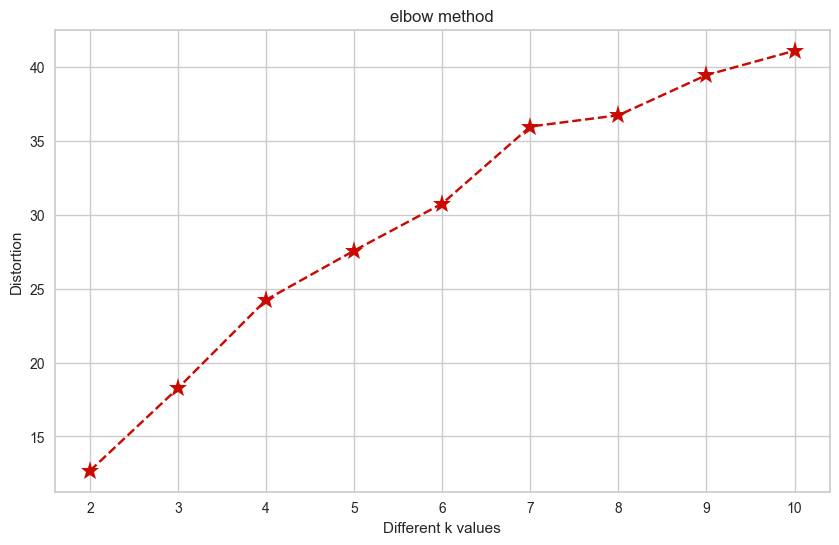

In [908]:
elbow_vis(scaled_X1, inertia = False)

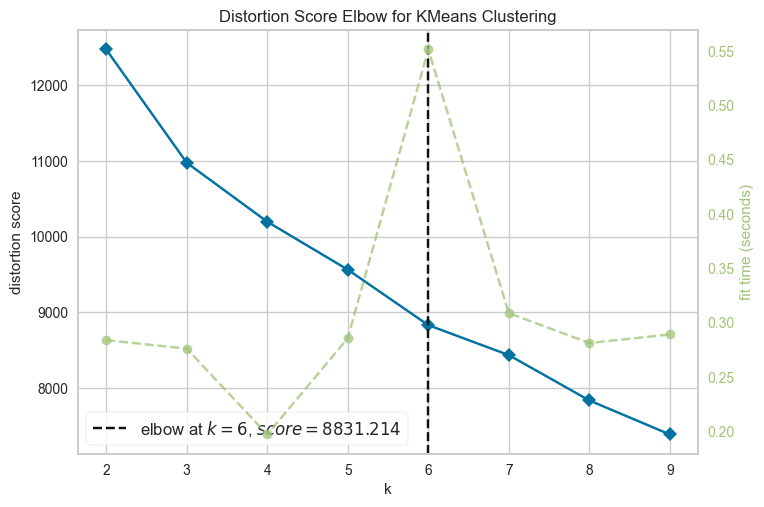

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [909]:

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X1)
visu.poof()

In [910]:
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X1)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X1, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.3809426476948133
For n_clusters=3, the silhouette score is 0.2835237315484053
For n_clusters=4, the silhouette score is 0.2616830021625505
For n_clusters=5, the silhouette score is 0.2180403866910262
For n_clusters=6, the silhouette score is 0.184649654101341
For n_clusters=7, the silhouette score is 0.1812374393893571
For n_clusters=8, the silhouette score is 0.1880657006055194
For n_clusters=9, the silhouette score is 0.19490350409722712


In [911]:
final_model2 = KMeans(n_clusters=6,
                     random_state=42)
final_model2.fit_predict(scaled_X1)

array([1, 5, 2, ..., 2, 2, 5], dtype=int32)

In [912]:
final_model2.labels_

array([1, 5, 2, ..., 2, 2, 5], dtype=int32)

In [913]:
clusters = final_model2.labels_

In [914]:
df2['predicted_clusters'] = clusters

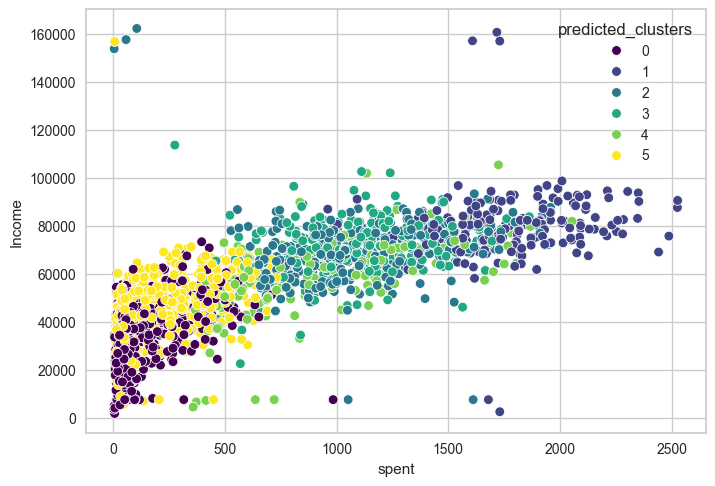

In [915]:
sns.scatterplot(data=df2, x="spent", y="Income", hue="predicted_clusters", palette = 'viridis');

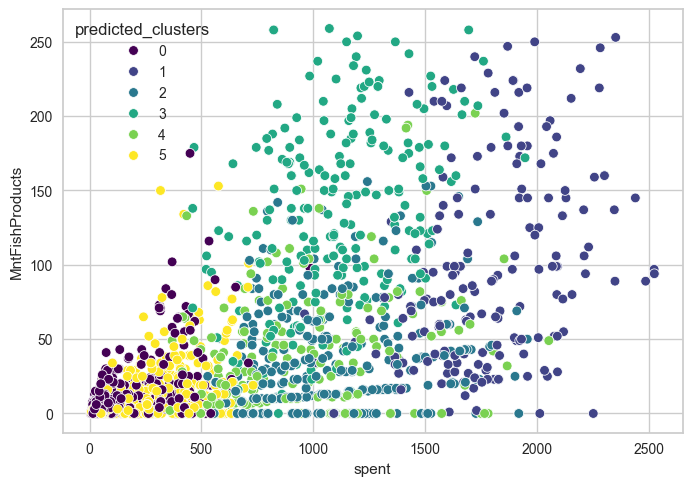

In [916]:
sns.scatterplot(data=df2, x="spent", y="MntFishProducts", hue="predicted_clusters", palette = 'viridis');

In [917]:
df2[(df2['predicted_clusters'] == 2) | (df2['predicted_clusters'] == 3)].corr()

,Income,MntWines,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,dt_days,spent,age,predicted_clusters
Income,1,-0.03,0.23,0.10,0.14,0.02,-0.28,0.14,-0.02,0.11
MntWines,-0.03,1,-0.17,-0.34,-0.32,-0.23,0.19,0.65,0.13,-0.49
MntMeatProducts,0.23,-0.17,1,0.30,0.23,0.15,-0.22,0.50,0.01,0.26
MntFishProducts,0.10,-0.34,0.30,1,0.41,0.42,-0.10,0.24,-0.12,0.71
MntSweetProducts,0.14,-0.32,0.23,0.41,1,0.37,-0.04,0.17,-0.08,0.70
MntGoldProds,0.02,-0.23,0.15,0.42,0.37,1,-0.04,0.20,-0.15,0.49
dt_days,-0.28,0.19,-0.22,-0.10,-0.04,-0.04,1,0.02,0.05,-0.11
spent,0.14,0.65,0.50,0.24,0.17,0.20,0.02,1,0.05,0.06
age,-0.02,0.13,0.01,-0.12,-0.08,-0.15,0.05,0.05,1,-0.20
predicted_clusters,0.11,-0.49,0.26,0.71,0.70,0.49,-0.11,0.06,-0.20,1


In [918]:
df2[df2['predicted_clusters'] == 3].describe().T

,count,mean,std,min,25%,50%,75%,max
Income,240,"71,933.60","11,683.11",22507,"65,304.75",72429,"79,942.25",113734
MntWines,240,409.63,197.28,6,265,394,522.75,983
MntMeatProducts,240,317.10,150.72,3,202,300,430.25,706
MntFishProducts,240,133.57,60.44,0,93,132,179,259
MntSweetProducts,240,99.02,50.56,0,61,96,138,262
MntGoldProds,240,81.85,55.32,0,41,65.50,108,249
dt_days,240,328.60,202.21,1,157.75,310.50,500.25,696
spent,240,"1,114.99",289.55,277,909.75,1125,"1,315.75",1947
age,240,44.86,12.46,19,36,43,55,71
predicted_clusters,240,3,0,3,3,3,3,3


DF3

KMEANS FİNAL 1

In [919]:
df3 = df[['Income', 'MntWines', 'MntMeatProducts', 'MntFishProducts', 'dt_days', 'spent', 'age']]
df3

,Income,MntWines,MntMeatProducts,MntFishProducts,dt_days,spent,age
0,58138,635,546,172,663,1617,57
1,46344,11,6,2,113,27,60
2,71613,426,127,111,312,776,49
3,26646,11,20,10,139,53,30
4,58293,173,118,46,161,422,33
...,...,...,...,...,...,...,...
2235,61223,709,182,42,381,1341,47
2236,64014,406,30,0,19,444,68
2237,56981,908,217,32,155,1241,33
2238,69245,428,214,80,156,843,58


In [920]:
scaled_df3 = scaler.fit_transform(df3)
scaled_df3

array([[ 0.30106461,  0.98333899,  1.679196  , ...,  1.53094037,
         1.67894446,  0.98492226],
       [-0.2406728 , -0.87082589, -0.71343033, ..., -1.19020352,
        -0.96163931,  1.23528074],
       [ 0.92001591,  0.36231261, -0.1773048 , ..., -0.20564419,
         0.28225833,  0.31729965],
       ...,
       [ 0.24791978,  1.79453612,  0.22146626, ..., -0.98240708,
         1.05450453, -1.01794557],
       [ 0.81124584,  0.36825545,  0.20817389, ..., -0.97745955,
         0.39352821,  1.06837508],
       [ 0.05904202, -0.65391237, -0.46973691, ...,  1.32809146,
        -0.72083136,  1.23528074]])

In [921]:
scaled_X2 = pd.DataFrame(scaled_df3, columns = df3.columns)
scaled_X2.head()

,Income,MntWines,MntMeatProducts,MntFishProducts,dt_days,spent,age
0,0.30,0.98,1.68,2.46,1.53,1.68,0.98
1,-0.24,-0.87,-0.71,-0.65,-1.19,-0.96,1.24
2,0.92,0.36,-0.18,1.34,-0.21,0.28,0.32
3,-1.15,-0.87,-0.65,-0.50,-1.06,-0.92,-1.27
4,0.31,-0.39,-0.22,0.15,-0.95,-0.31,-1.02


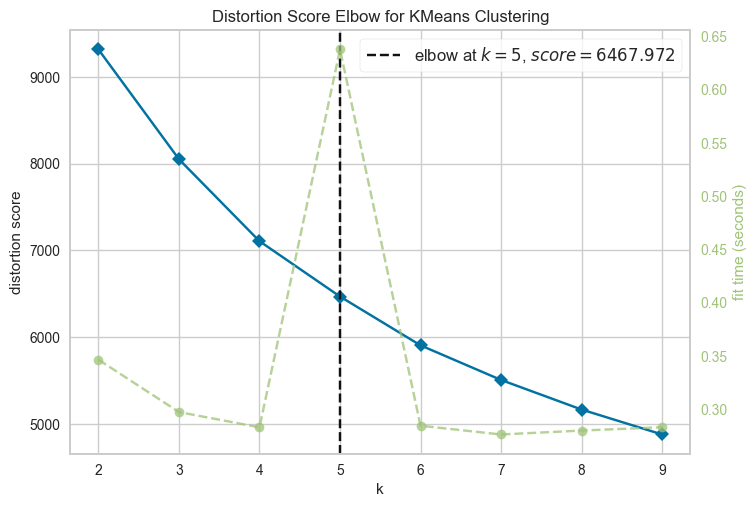

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [922]:

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X2)
visu.poof()

In [923]:
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X2)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X2, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.38831051669997757
For n_clusters=3, the silhouette score is 0.27716778869876685
For n_clusters=4, the silhouette score is 0.214116380899683
For n_clusters=5, the silhouette score is 0.22087059917049348
For n_clusters=6, the silhouette score is 0.2187740336793957
For n_clusters=7, the silhouette score is 0.21485815332685648
For n_clusters=8, the silhouette score is 0.22447197411209077
For n_clusters=9, the silhouette score is 0.21182441598274224


In [924]:
final_model3 = KMeans(n_clusters=5,
                     random_state=42)
final_model3.fit_predict(scaled_X2)

array([1, 3, 1, ..., 2, 2, 0], dtype=int32)

In [925]:
final_model3.labels_

array([1, 3, 1, ..., 2, 2, 0], dtype=int32)

In [926]:
clusters = final_model3.labels_

In [927]:
df3['predicted_clusters'] = clusters

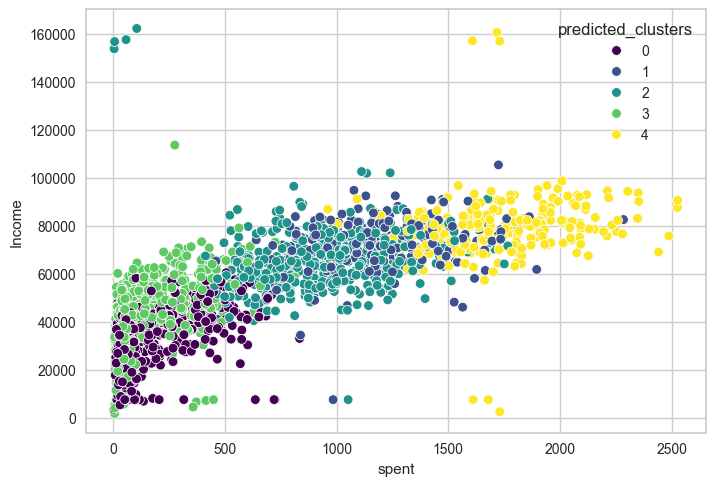

In [928]:
sns.scatterplot(data=df3, x="spent", y="Income", hue="predicted_clusters", palette = 'viridis');

In [929]:
df3.predicted_clusters = df3.predicted_clusters.map({0: 'Bronse', 3: 'Silver', 2: 'Gold', 1: 'Platinium', 4: 'Diamond'})

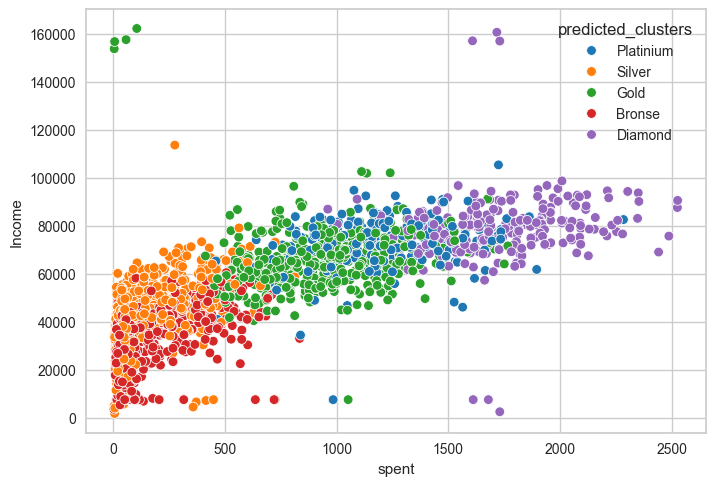

In [930]:
sns.scatterplot(data=df3, x="spent", y="Income", hue="predicted_clusters", palette = 'tab10');

In [931]:
df2.corr()

,Income,MntWines,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,dt_days,spent,age,predicted_clusters
Income,1,0.68,0.67,0.51,0.51,0.38,-0.03,0.78,0.19,0.23
MntWines,0.68,1,0.56,0.40,0.39,0.39,0.17,0.89,0.16,0.08
MntMeatProducts,0.67,0.56,1,0.57,0.52,0.35,0.09,0.84,0.03,-0.03
MntFishProducts,0.51,0.40,0.57,1,0.58,0.42,0.08,0.64,0.04,0.07
MntSweetProducts,0.51,0.39,0.52,0.58,1,0.37,0.08,0.60,0.02,0.06
MntGoldProds,0.38,0.39,0.35,0.42,0.37,1,0.16,0.52,0.06,0.23
dt_days,-0.03,0.17,0.09,0.08,0.08,0.16,1,0.16,-0.02,-0.09
spent,0.78,0.89,0.84,0.64,0.60,0.52,0.16,1,0.11,0.07
age,0.19,0.16,0.03,0.04,0.02,0.06,-0.02,0.11,1,0.58
predicted_clusters,0.23,0.08,-0.03,0.07,0.06,0.23,-0.09,0.07,0.58,1


In [932]:
df_numeric.corr()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumStorePurchases,NumWebVisitsMonth,Response,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases
Income,1,-0.51,0.03,0.00,0.68,0.50,0.67,0.51,0.51,0.38,...,0.62,-0.63,0.17,-0.03,-0.36,-0.29,0.19,0.78,0.35,0.66
Kidhome,-0.51,1,-0.04,0.01,-0.50,-0.37,-0.44,-0.39,-0.37,-0.35,...,-0.50,0.45,-0.08,-0.05,0.67,0.55,-0.23,-0.56,-0.22,-0.48
Teenhome,0.03,-0.04,1,0.02,0.00,-0.18,-0.26,-0.20,-0.16,-0.02,...,0.05,0.14,-0.15,0.02,0.69,0.58,0.35,-0.14,-0.12,0.13
Recency,0.00,0.01,0.02,1,0.02,-0.00,0.02,0.00,0.02,0.02,...,0.00,-0.02,-0.20,0.02,0.01,0.01,0.02,0.02,-0.01,0.01
MntWines,0.68,-0.50,0.00,0.02,1,0.39,0.56,0.40,0.39,0.39,...,0.64,-0.32,0.25,0.17,-0.36,-0.30,0.16,0.89,0.52,0.71
MntFruits,0.50,-0.37,-0.18,-0.00,0.39,1,0.54,0.59,0.57,0.39,...,0.46,-0.42,0.13,0.07,-0.41,-0.34,0.02,0.61,0.16,0.46
MntMeatProducts,0.67,-0.44,-0.26,0.02,0.56,0.54,1,0.57,0.52,0.35,...,0.48,-0.54,0.24,0.09,-0.52,-0.43,0.03,0.84,0.31,0.55
MntFishProducts,0.51,-0.39,-0.20,0.00,0.40,0.59,0.57,1,0.58,0.42,...,0.46,-0.45,0.11,0.08,-0.44,-0.36,0.04,0.64,0.18,0.47
MntSweetProducts,0.51,-0.37,-0.16,0.02,0.39,0.57,0.52,0.58,1,0.37,...,0.45,-0.42,0.12,0.08,-0.39,-0.33,0.02,0.60,0.19,0.47
MntGoldProds,0.38,-0.35,-0.02,0.02,0.39,0.39,0.35,0.42,0.37,1,...,0.38,-0.25,0.14,0.16,-0.27,-0.23,0.06,0.52,0.20,0.49


KMEAN FİNAL 2

In [933]:
df4 = df[['Income', 'Teenhome', 'siblings',  'family_s', 'age', 'spent', 'NumTotalPurchases']]
df4

,Income,Teenhome,siblings,family_s,age,spent,NumTotalPurchases
0,58138,0,0,1,57,1617,25
1,46344,1,2,3,60,27,6
2,71613,0,0,2,49,776,21
3,26646,0,1,3,30,53,8
4,58293,0,1,3,33,422,19
...,...,...,...,...,...,...,...
2235,61223,1,1,3,47,1341,18
2236,64014,1,2,4,68,444,22
2237,56981,0,0,1,33,1241,19
2238,69245,1,1,3,58,843,23


In [934]:
scaled_df4 = scaler.fit_transform(df4)
scaled_df4

array([[ 0.30106461, -0.93028167, -1.32220008, ...,  0.98492226,
         1.67894446,  1.32038124],
       [-0.2406728 ,  0.9064914 ,  1.53120328, ...,  1.23528074,
        -0.96163931, -1.15462816],
       [ 0.92001591, -0.93028167, -1.32220008, ...,  0.31729965,
         0.28225833,  0.79932663],
       ...,
       [ 0.24791978, -0.93028167, -1.32220008, ..., -1.01794557,
         1.05450453,  0.53879932],
       [ 0.81124584,  0.9064914 ,  0.1045016 , ...,  1.06837508,
         0.39352821,  1.05985393],
       [ 0.05904202,  0.9064914 ,  1.53120328, ...,  1.23528074,
        -0.72083136, -0.5033099 ]])

In [935]:
scaled_X4 = pd.DataFrame(scaled_df4, columns = df4.columns)
scaled_X4.head()

,Income,Teenhome,siblings,family_s,age,spent,NumTotalPurchases
0,0.30,-0.93,-1.32,-1.81,0.98,1.68,1.32
1,-0.24,0.91,1.53,0.49,1.24,-0.96,-1.15
2,0.92,-0.93,-1.32,-0.66,0.32,0.28,0.80
3,-1.15,-0.93,0.10,0.49,-1.27,-0.92,-0.89
4,0.31,-0.93,0.10,0.49,-1.02,-0.31,0.54


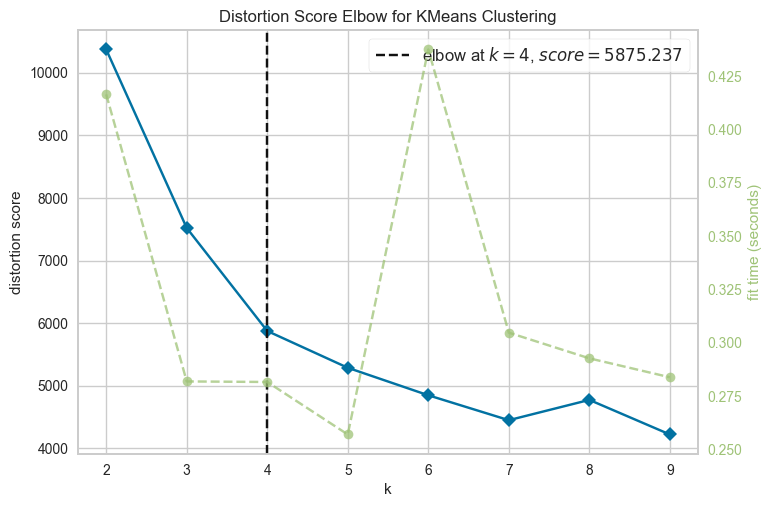

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [936]:

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X4)
visu.poof()

In [937]:
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X4)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X4, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.3133826055072254
For n_clusters=3, the silhouette score is 0.3371500254251302
For n_clusters=4, the silhouette score is 0.35216255678423936
For n_clusters=5, the silhouette score is 0.3333525353180942
For n_clusters=6, the silhouette score is 0.3001170429014898
For n_clusters=7, the silhouette score is 0.30033954858091555
For n_clusters=8, the silhouette score is 0.29390235095431083
For n_clusters=9, the silhouette score is 0.28729002392719005


In [938]:
final_model4 = KMeans(n_clusters=4,
                     random_state=42)
final_model4.fit_predict(scaled_X4)

array([2, 3, 2, ..., 2, 1, 3], dtype=int32)

In [939]:
final_model4.labels_

array([2, 3, 2, ..., 2, 1, 3], dtype=int32)

In [940]:
clusters = final_model4.labels_

In [941]:
df4['predicted_clusters'] = clusters

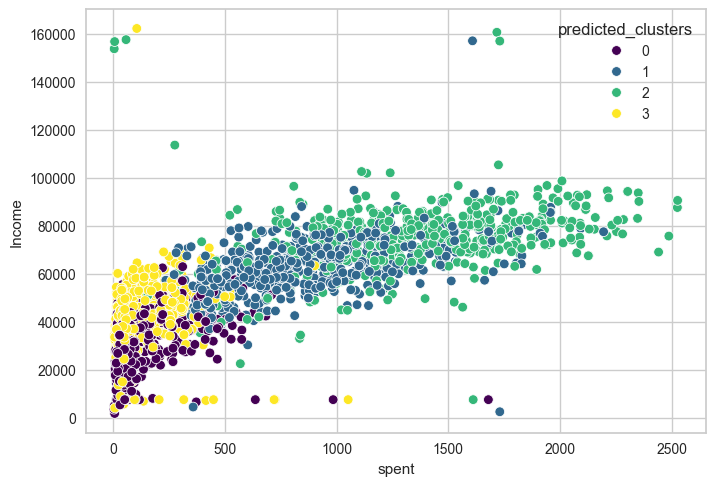

In [942]:
sns.scatterplot(data=df4, x="spent", y="Income", hue="predicted_clusters", palette = 'viridis');

In [943]:
df4.predicted_clusters = df4.predicted_clusters.map({0: 'Bronse', 3: 'Silver', 1: 'Gold', 2: 'Platinium'})

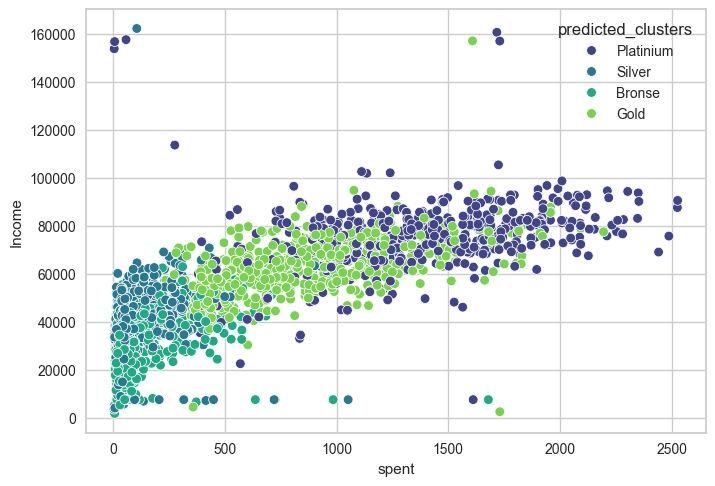

In [944]:
sns.scatterplot(data=df4, x="spent", y="Income", hue="predicted_clusters", palette = 'viridis');

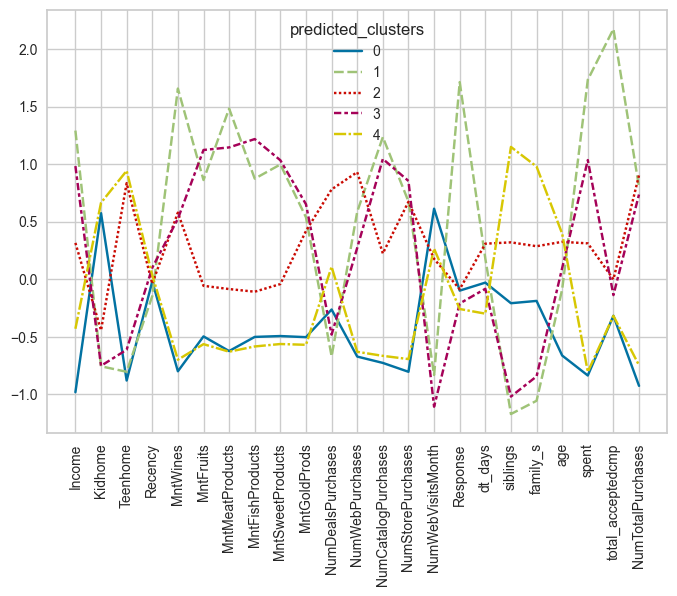

In [945]:
sns.lineplot(data = clus_pred)
plt.xticks(rotation=90)
plt.show()


In [946]:
df.columns

Index(['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Response', 'dt_days',
       'siblings', 'family_s', 'age', 'spent', 'total_acceptedcmp',
       'NumTotalPurchases'],
      dtype='object')

In [947]:
df5 = df[['Income', 'Teenhome', 'MntWines', 'MntMeatProducts', 'MntFishProducts', 'Response', 'dt_days', 'siblings',  'family_s', 'age', 'spent', 'NumTotalPurchases', 'total_acceptedcmp']]
df5

,Income,Teenhome,MntWines,MntMeatProducts,MntFishProducts,Response,dt_days,siblings,family_s,age,spent,NumTotalPurchases,total_acceptedcmp
0,58138,0,635,546,172,1,663,0,1,57,1617,25,0
1,46344,1,11,6,2,0,113,2,3,60,27,6,0
2,71613,0,426,127,111,0,312,0,2,49,776,21,0
3,26646,0,11,20,10,0,139,1,3,30,53,8,0
4,58293,0,173,118,46,0,161,1,3,33,422,19,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223,1,709,182,42,0,381,1,3,47,1341,18,0
2236,64014,1,406,30,0,0,19,2,4,68,444,22,1
2237,56981,0,908,217,32,0,155,0,1,33,1241,19,1
2238,69245,1,428,214,80,0,156,1,3,58,843,23,0


In [948]:
scaled_df5 = scaler.fit_transform(df5)
scaled_df5

array([[ 0.30106461, -0.93028167,  0.98333899, ...,  1.67894446,
         1.32038124, -0.47477597],
       [-0.2406728 ,  0.9064914 , -0.87082589, ..., -0.96163931,
        -1.15462816, -0.47477597],
       [ 0.92001591, -0.93028167,  0.36231261, ...,  0.28225833,
         0.79932663, -0.47477597],
       ...,
       [ 0.24791978, -0.93028167,  1.79453612, ...,  1.05450453,
         0.53879932,  1.29398177],
       [ 0.81124584,  0.9064914 ,  0.36825545, ...,  0.39352821,
         1.05985393, -0.47477597],
       [ 0.05904202,  0.9064914 , -0.65391237, ..., -0.72083136,
        -0.5033099 , -0.47477597]])

In [949]:
scaled_X5 = pd.DataFrame(scaled_df5, columns = df5.columns)
scaled_X5.head()

,Income,Teenhome,MntWines,MntMeatProducts,MntFishProducts,Response,dt_days,siblings,family_s,age,spent,NumTotalPurchases,total_acceptedcmp
0,0.30,-0.93,0.98,1.68,2.46,2.39,1.53,-1.32,-1.81,0.98,1.68,1.32,-0.47
1,-0.24,0.91,-0.87,-0.71,-0.65,-0.42,-1.19,1.53,0.49,1.24,-0.96,-1.15,-0.47
2,0.92,-0.93,0.36,-0.18,1.34,-0.42,-0.21,-1.32,-0.66,0.32,0.28,0.80,-0.47
3,-1.15,-0.93,-0.87,-0.65,-0.50,-0.42,-1.06,0.10,0.49,-1.27,-0.92,-0.89,-0.47
4,0.31,-0.93,-0.39,-0.22,0.15,-0.42,-0.95,0.10,0.49,-1.02,-0.31,0.54,-0.47


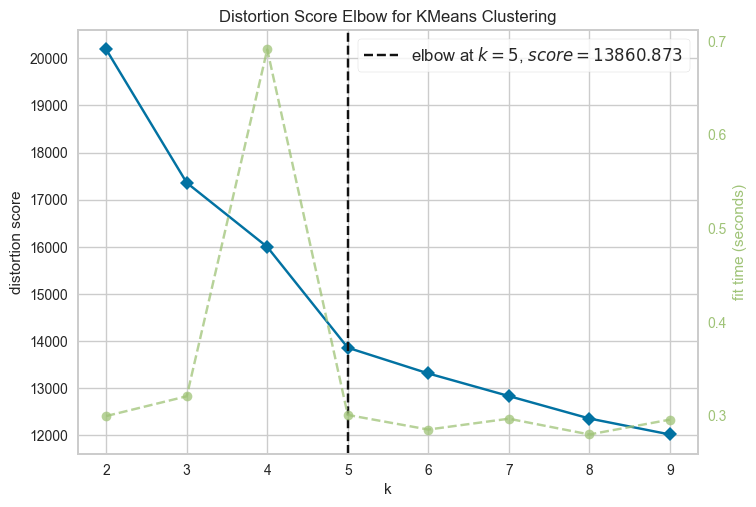

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [950]:

kmeans = KMeans(random_state=42)
visu = KElbowVisualizer(kmeans, k = (2,10))
visu.fit(scaled_X5)
visu.poof()

In [951]:
range_n_clusters = range(2,10)
for num_clusters in range_n_clusters:
    # initialise kmeans
    kmeans = KMeans(n_clusters=num_clusters,
                    random_state=42)
    kmeans.fit(scaled_X5)
    cluster_labels = kmeans.labels_
    
    # silhouette score
    silhouette_avg = silhouette_score(scaled_X5, cluster_labels)
    print(f"For n_clusters={num_clusters}, the silhouette score is {silhouette_avg}")

For n_clusters=2, the silhouette score is 0.29948819997637993
For n_clusters=3, the silhouette score is 0.22391556409919616
For n_clusters=4, the silhouette score is 0.22049627555819928
For n_clusters=5, the silhouette score is 0.22232604813538406
For n_clusters=6, the silhouette score is 0.19188587327227724
For n_clusters=7, the silhouette score is 0.18156457707354434
For n_clusters=8, the silhouette score is 0.18010737071831023
For n_clusters=9, the silhouette score is 0.1746046508431945


In [952]:
final_model5 = KMeans(n_clusters=5,
                     random_state=42)
final_model5.fit_predict(scaled_X5)

array([3, 0, 3, ..., 3, 2, 0], dtype=int32)

In [953]:
final_model5.labels_

array([3, 0, 3, ..., 3, 2, 0], dtype=int32)

In [954]:
clusters = final_model5.labels_

In [955]:
df5['predicted_clusters'] = clusters

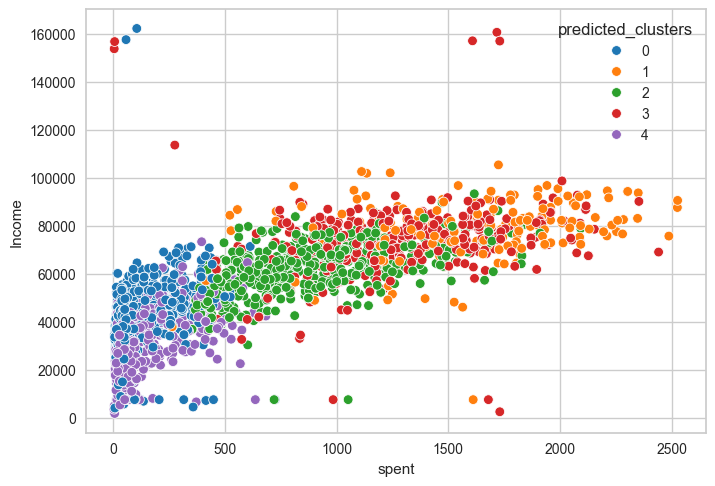

In [956]:
sns.scatterplot(data=df5, x="spent", y="Income", hue="predicted_clusters", palette = 'tab10');

#### We have made our inferences on the Kmeans algorithm so far, and we will take and compare the results with another clustering algorithm, Hierarchical Clustering:


### The point we need to pay attention to is the number of clusters in kmeans so that we can find the differences.

## Hierarchical Clustering

### Determine optimal number of clusters using Dendogram

In [957]:
scaler = StandardScaler()

scaled_X = scaler.fit_transform(df_numeric)

In [958]:
hopkins(scaled_X, 1)

0.8421588490374478

In [959]:
df_h1 = df_numeric.copy()
df_h2 = df_numeric.copy()

In [960]:
result = []
for _ in range(10):
    result.append(hopkins(MinMaxScaler().fit_transform(df_h1), 1))
np.mean(result)

0.8294478023125688

In [961]:
result = []
for _ in range(10):
    result.append(hopkins(StandardScaler().fit_transform(df_h2), 1))
np.mean(result)

0.8424185186210293

In [962]:
df_scaled = scaler.fit_transform(df_numeric)

In [963]:
X = pd.DataFrame(df_scaled, columns= df_numeric.columns)

X

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumStorePurchases,NumWebVisitsMonth,Response,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases
0,0.30,-0.82,-0.93,0.31,0.98,1.55,1.68,2.46,1.48,0.84,...,-0.55,0.69,2.39,1.53,-1.32,-1.81,0.98,1.68,-0.47,1.32
1,-0.24,1.03,0.91,-0.38,-0.87,-0.64,-0.71,-0.65,-0.63,-0.73,...,-1.17,-0.13,-0.42,-1.19,1.53,0.49,1.24,-0.96,-0.47,-1.15
2,0.92,-0.82,-0.93,-0.80,0.36,0.57,-0.18,1.34,-0.15,-0.04,...,1.29,-0.54,-0.42,-0.21,-1.32,-0.66,0.32,0.28,-0.47,0.80
3,-1.15,1.03,-0.93,-0.80,-0.87,-0.56,-0.65,-0.50,-0.58,-0.75,...,-0.55,0.28,-0.42,-1.06,0.10,0.49,-1.27,-0.92,-0.47,-0.89
4,0.31,1.03,-0.93,1.55,-0.39,0.42,-0.22,0.15,-0.00,-0.56,...,0.06,-0.13,-0.42,-0.95,0.10,0.49,-1.02,-0.31,-0.47,0.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,0.44,-0.82,0.91,-0.11,1.20,0.42,0.07,0.08,2.20,3.89,...,-0.55,-0.13,-0.42,0.14,0.10,0.49,0.15,1.22,-0.47,0.41
2235,0.57,2.89,0.91,0.24,0.30,-0.66,-0.61,-0.69,-0.66,-0.69,...,-0.24,0.69,-0.42,-1.66,1.53,1.65,1.90,-0.27,1.29,0.93
2236,0.25,-0.82,-0.93,1.45,1.79,0.55,0.22,-0.10,-0.37,-0.38,...,2.22,0.28,-0.42,-0.98,-1.32,-1.81,-1.02,1.05,1.29,0.54
2237,0.81,-0.82,0.91,-1.42,0.37,0.09,0.21,0.78,0.07,0.33,...,1.29,-0.95,-0.42,-0.98,0.10,0.49,1.07,0.39,-0.47,1.06


In [964]:
X1 = X.copy()

In [965]:
from scipy.cluster.hierarchy import dendrogram, linkage

In [966]:
hc_ward = linkage(y=X1, method="ward")
hc_complete = linkage(X1, "complete")
hc_average = linkage(X1, "average")
hc_single = linkage(X1, "single")

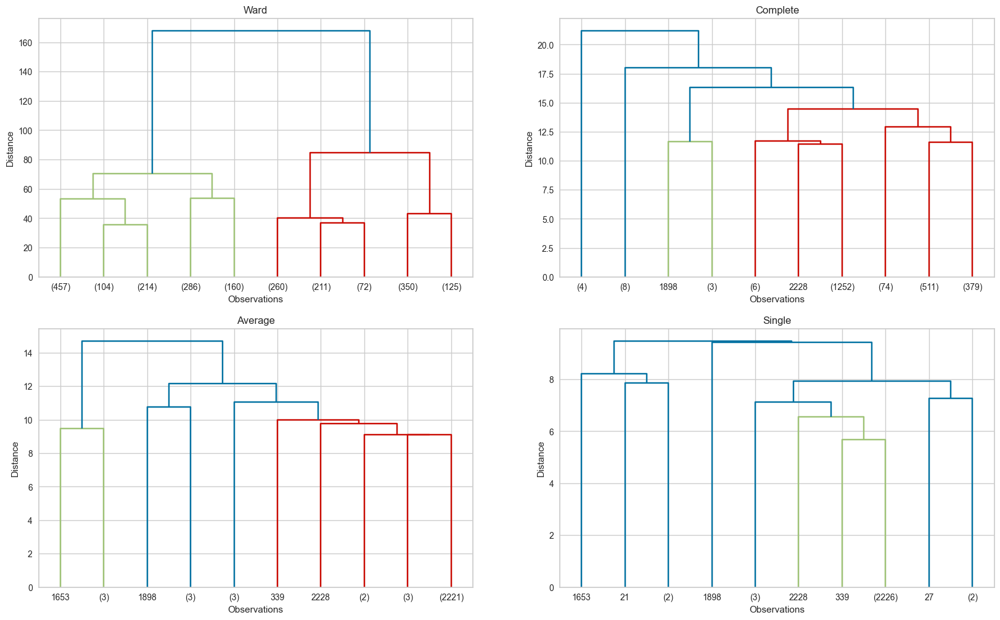

In [967]:
plt.figure(figsize=(20,12))

plt.subplot(221)
plt.title("Ward")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_ward, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(222)
plt.title("Complete")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_complete, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(223)
plt.title("Average")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_average, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(224)
plt.title("Single")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_single, leaf_font_size=10, truncate_mode='lastp', p=10);

### silhouette_score

In [968]:
K = range(2,10)

for k in K:
    model = AgglomerativeClustering(n_clusters=k)
    model.fit_predict(X1)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(X1, model.labels_)}')

Silhouette Score for 2 clusters: 0.2594588014466305
Silhouette Score for 3 clusters: 0.2123582584779145
Silhouette Score for 4 clusters: 0.1427972170350092
Silhouette Score for 5 clusters: 0.11857265497514845
Silhouette Score for 6 clusters: 0.1283544869053947
Silhouette Score for 7 clusters: 0.12334971827474817
Silhouette Score for 8 clusters: 0.1219792519296553
Silhouette Score for 9 clusters: 0.12142948222240003


In [969]:
model = AgglomerativeClustering(n_clusters=5,
                                metric="euclidean",
                                linkage="ward")
clusters = model.fit_predict(X1)

In [970]:
X1["clusters"] = clusters
X1.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumWebVisitsMonth,Response,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases,clusters
0,0.30,-0.82,-0.93,0.31,0.98,1.55,1.68,2.46,1.48,0.84,...,0.69,2.39,1.53,-1.32,-1.81,0.98,1.68,-0.47,1.32,1
1,-0.24,1.03,0.91,-0.38,-0.87,-0.64,-0.71,-0.65,-0.63,-0.73,...,-0.13,-0.42,-1.19,1.53,0.49,1.24,-0.96,-0.47,-1.15,4
2,0.92,-0.82,-0.93,-0.80,0.36,0.57,-0.18,1.34,-0.15,-0.04,...,-0.54,-0.42,-0.21,-1.32,-0.66,0.32,0.28,-0.47,0.80,1
3,-1.15,1.03,-0.93,-0.80,-0.87,-0.56,-0.65,-0.50,-0.58,-0.75,...,0.28,-0.42,-1.06,0.10,0.49,-1.27,-0.92,-0.47,-0.89,0
4,0.31,1.03,-0.93,1.55,-0.39,0.42,-0.22,0.15,-0.00,-0.56,...,-0.13,-0.42,-0.95,0.10,0.49,-1.02,-0.31,-0.47,0.54,0


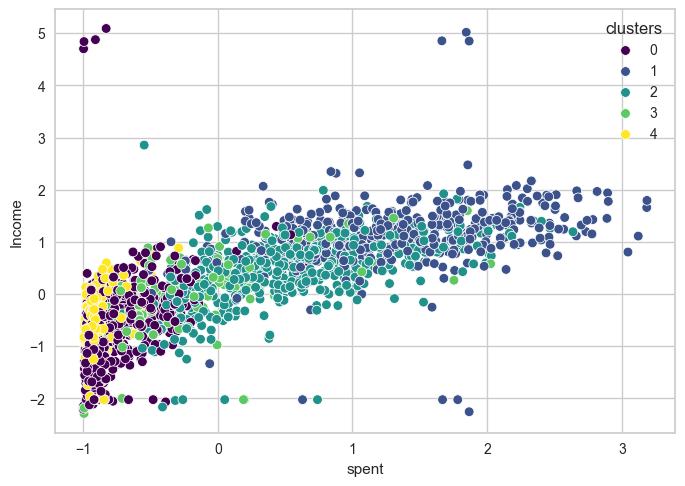

In [971]:
sns.scatterplot(data=X1, x="spent", y="Income", hue="clusters", palette = 'viridis');

Cluster 4

In [972]:
X2 = X.copy()

In [973]:
model = AgglomerativeClustering(n_clusters=4,
                                metric="euclidean",
                                linkage="ward")
clusters = model.fit_predict(X2)

In [974]:
X2["clusters"] = clusters
X2.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumWebVisitsMonth,Response,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases,clusters
0,0.30,-0.82,-0.93,0.31,0.98,1.55,1.68,2.46,1.48,0.84,...,0.69,2.39,1.53,-1.32,-1.81,0.98,1.68,-0.47,1.32,3
1,-0.24,1.03,0.91,-0.38,-0.87,-0.64,-0.71,-0.65,-0.63,-0.73,...,-0.13,-0.42,-1.19,1.53,0.49,1.24,-0.96,-0.47,-1.15,0
2,0.92,-0.82,-0.93,-0.80,0.36,0.57,-0.18,1.34,-0.15,-0.04,...,-0.54,-0.42,-0.21,-1.32,-0.66,0.32,0.28,-0.47,0.80,3
3,-1.15,1.03,-0.93,-0.80,-0.87,-0.56,-0.65,-0.50,-0.58,-0.75,...,0.28,-0.42,-1.06,0.10,0.49,-1.27,-0.92,-0.47,-0.89,1
4,0.31,1.03,-0.93,1.55,-0.39,0.42,-0.22,0.15,-0.00,-0.56,...,-0.13,-0.42,-0.95,0.10,0.49,-1.02,-0.31,-0.47,0.54,1


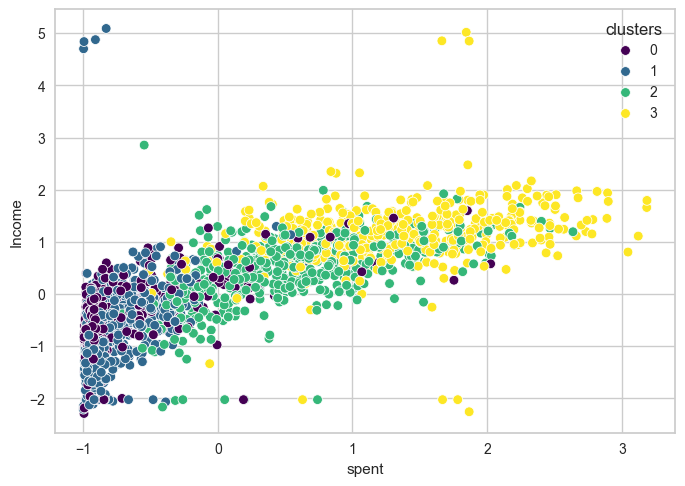

In [975]:
sns.scatterplot(data=X2, x="spent", y="Income", hue="clusters", palette = 'viridis');

### Clustering based on selected features

In [978]:
clus_pred = X2.groupby("clusters").mean().T
clus_pred

clusters,0,1,2,3
Income,-0.38,-0.77,0.42,1.13
Kidhome,1.20,0.24,-0.64,-0.79
Teenhome,0.91,-0.41,0.63,-0.90
Recency,0.02,-0.03,0.00,0.03
MntWines,-0.52,-0.72,0.68,0.90
MntFruits,-0.49,-0.49,0.24,0.97
MntMeatProducts,-0.52,-0.61,0.04,1.44
MntFishProducts,-0.51,-0.52,0.27,1.02
MntSweetProducts,-0.46,-0.50,0.29,0.91
MntGoldProds,-0.40,-0.49,0.55,0.56


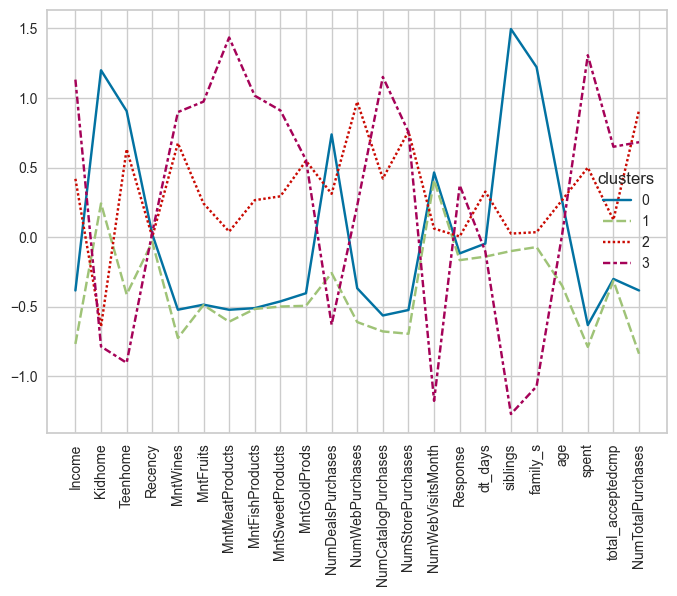

In [979]:
sns.lineplot(data=clus_pred)
plt.xticks(rotation=90)

plt.show()

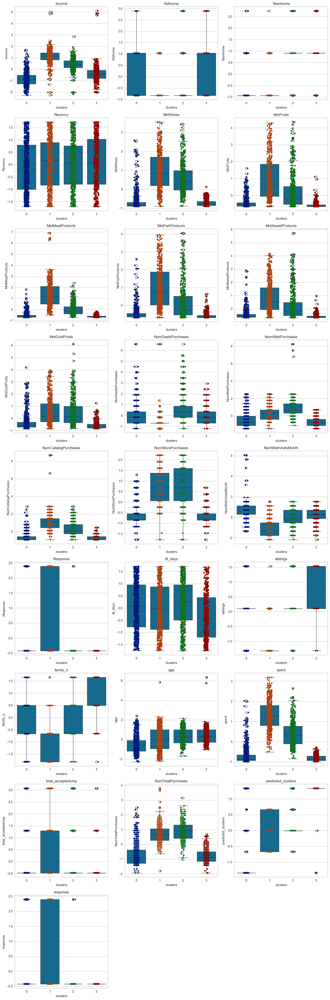

In [2908]:
numeric_columns = X2.iloc[:, :-1].columns

# Calculate the number of subplots needed based on the number of numeric columns
num_plots = len(numeric_columns)


# Calculate number of rows for subplot grid (3 rows per column)
num_rows = (num_plots + 2) // 3 



# Define the figure size based on the number of plots
plt.figure(figsize=(15, 5*num_rows))

# Iterate over each numeric column
for i, col in enumerate(numeric_columns, start=1):
    plt.subplot(num_rows, 3, i)
    
    # Create boxplot
    sns.boxplot(data= X2, y=col, x="clusters")
    
    # Create stripplot
    sns.stripplot(data= X2, y=col, x="clusters", palette="dark")
    
    # Set subplot title
    plt.title(col)
    
plt.tight_layout()
plt.show()

In [ ]:
clus_pred = X2.groupby("clusters").mean().T
clus_pred

In [2909]:
X.T

,0,1,2,3,4,5,6,7,8,9,...,2229,2230,2231,2232,2233,2234,2235,2236,2237,2238
Income,0.30,-0.24,0.92,-1.15,0.31,0.50,0.19,-0.83,-0.98,-2.11,...,-1.25,-1.86,-0.31,-1.14,-0.79,0.44,0.57,0.25,0.81,0.06
Kidhome,-0.82,1.03,-0.82,1.03,1.03,-0.82,-0.82,1.03,1.03,1.03,...,2.89,1.03,-0.82,-0.82,1.03,-0.82,2.89,-0.82,-0.82,1.03
Teenhome,-0.93,0.91,-0.93,-0.93,-0.93,0.91,0.91,-0.93,-0.93,0.91,...,-0.93,-0.93,-0.93,-0.93,-0.93,0.91,0.91,-0.93,0.91,0.91
Recency,0.31,-0.38,-0.80,-0.80,1.55,-1.14,-0.52,-0.59,-1.04,0.65,...,-1.39,1.14,0.76,0.03,1.10,-0.11,0.24,1.45,-1.42,-0.31
MntWines,0.98,-0.87,0.36,-0.87,-0.39,0.64,-0.21,-0.68,-0.86,-0.82,...,-0.89,-0.83,1.63,-0.89,-0.89,1.20,0.30,1.79,0.37,-0.65
MntFruits,1.55,-0.64,0.57,-0.56,0.42,0.39,0.97,-0.41,-0.66,-0.66,...,-0.61,-0.59,-0.41,-0.64,-0.59,0.42,-0.66,0.55,0.09,-0.59
MntMeatProducts,1.68,-0.71,-0.18,-0.65,-0.22,-0.31,-0.01,-0.49,-0.63,-0.71,...,-0.70,-0.62,-0.11,-0.71,-0.71,0.07,-0.61,0.22,0.21,-0.47
MntFishProducts,2.46,-0.65,1.34,-0.50,0.15,-0.69,0.23,-0.63,-0.63,-0.67,...,-0.32,-0.56,-0.45,-0.63,-0.58,0.08,-0.69,-0.10,0.78,-0.65
MntSweetProducts,1.48,-0.63,-0.15,-0.58,-0.00,0.36,0.53,-0.63,-0.58,-0.63,...,-0.66,-0.63,-0.41,-0.56,-0.61,2.20,-0.66,-0.37,0.07,-0.63
MntGoldProds,0.84,-0.73,-0.04,-0.75,-0.56,-0.58,-0.33,-0.40,-0.81,-0.59,...,-0.52,-0.40,-0.46,-0.79,-0.67,3.89,-0.69,-0.38,0.33,-0.44


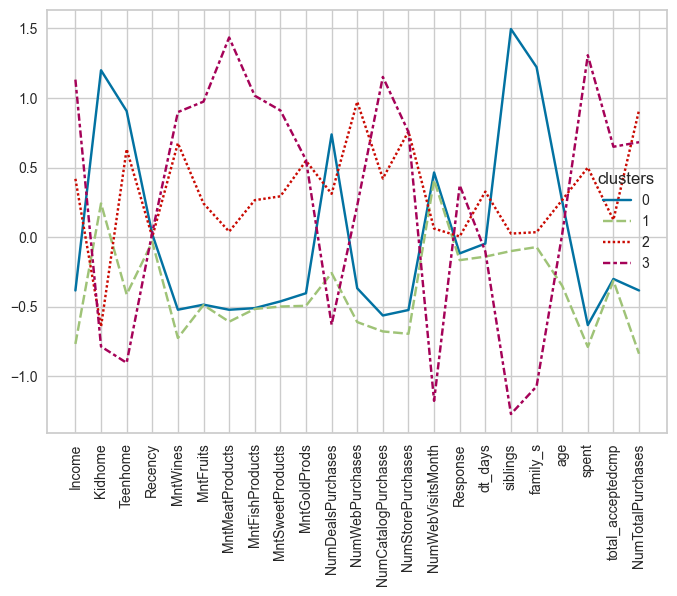

In [980]:
sns.lineplot(data=clus_pred)
plt.xticks(rotation=90)

plt.show()

In [981]:
X3 = X[['Income', 'family_s', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'NumDealsPurchases','NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases',  'NumWebVisitsMonth', 'siblings', 'spent', 'NumTotalPurchases']]
X3

,Income,family_s,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,siblings,spent,NumTotalPurchases
0,0.30,-1.81,0.98,1.55,1.68,2.46,1.48,0.35,1.41,2.51,-0.55,0.69,-1.32,1.68,1.32
1,-0.24,0.49,-0.87,-0.64,-0.71,-0.65,-0.63,-0.17,-1.11,-0.57,-1.17,-0.13,1.53,-0.96,-1.15
2,0.92,-0.66,0.36,0.57,-0.18,1.34,-0.15,-0.69,1.41,-0.23,1.29,-0.54,-1.32,0.28,0.80
3,-1.15,0.49,-0.87,-0.56,-0.65,-0.50,-0.58,-0.17,-0.75,-0.91,-0.55,0.28,0.10,-0.92,-0.89
4,0.31,0.49,-0.39,0.42,-0.22,0.15,-0.00,1.39,0.33,0.12,0.06,-0.13,0.10,-0.31,0.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,0.44,0.49,1.20,0.42,0.07,0.08,2.20,-0.17,1.77,0.12,-0.55,-0.13,0.10,1.22,0.41
2235,0.57,1.65,0.30,-0.66,-0.61,-0.69,-0.66,2.42,1.41,-0.23,-0.24,0.69,1.53,-0.27,0.93
2236,0.25,-1.81,1.79,0.55,0.22,-0.10,-0.37,-0.69,-0.75,0.12,2.22,0.28,-1.32,1.05,0.54
2237,0.81,0.49,0.37,0.09,0.21,0.78,0.07,-0.17,0.69,0.80,1.29,-0.95,0.10,0.39,1.06


In [982]:
hopkins(X3, 1)

0.8905718096150528

In [983]:
hc_ward = linkage(y = X3, method = "ward")
hc_complete = linkage(X3, "complete")
hc_average = linkage(X3, "average")
hc_single = linkage(X3, "single")

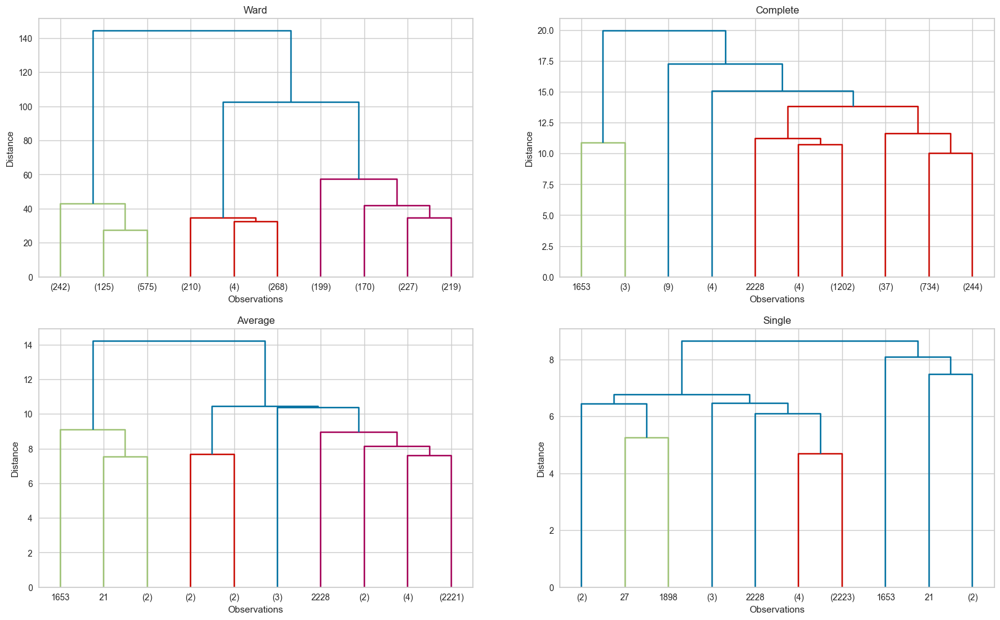

In [984]:
plt.figure(figsize=(20,12))

plt.subplot(221)
plt.title("Ward")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_ward, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(222)
plt.title("Complete")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_complete, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(223)
plt.title("Average")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_average, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(224)
plt.title("Single")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_single, leaf_font_size=10, truncate_mode='lastp', p=10);

In [985]:
K = range(2,10)

for k in K:
    model = AgglomerativeClustering(n_clusters = k)
    model.fit_predict(X3)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(X3, model.labels_)}')

Silhouette Score for 2 clusters: 0.28235400431890095
Silhouette Score for 3 clusters: 0.2753803761013757
Silhouette Score for 4 clusters: 0.23486956413724938
Silhouette Score for 5 clusters: 0.1740010497715718
Silhouette Score for 6 clusters: 0.1704644281588999
Silhouette Score for 7 clusters: 0.1608659807640069
Silhouette Score for 8 clusters: 0.14966619672995107
Silhouette Score for 9 clusters: 0.15168332888607514


In [1043]:
final_model = AgglomerativeClustering(n_clusters=3,
                                      metric="euclidean",
                                      linkage="ward")
clusters = final_model.fit_predict(X3)

In [1044]:
X3["clusters"] = clusters

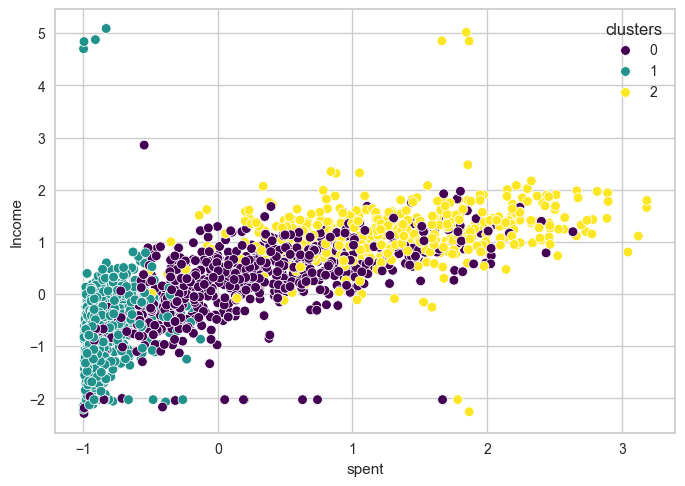

In [1045]:
sns.scatterplot(data=X3, x="spent", y="Income", hue="clusters", palette = 'viridis');

Future selection 2

In [2918]:
X4 = X.copy()

In [995]:
X4 = X[['Income', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases','NumWebPurchases', 'NumStorePurchases',  'NumWebVisitsMonth', 'siblings', 'family_s', 'spent', 'age', 'NumTotalPurchases']]
X4

,Income,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumStorePurchases,NumWebVisitsMonth,siblings,family_s,spent,age,NumTotalPurchases
0,0.30,0.98,1.55,1.68,2.46,1.48,0.84,0.35,1.41,-0.55,0.69,-1.32,-1.81,1.68,0.98,1.32
1,-0.24,-0.87,-0.64,-0.71,-0.65,-0.63,-0.73,-0.17,-1.11,-1.17,-0.13,1.53,0.49,-0.96,1.24,-1.15
2,0.92,0.36,0.57,-0.18,1.34,-0.15,-0.04,-0.69,1.41,1.29,-0.54,-1.32,-0.66,0.28,0.32,0.80
3,-1.15,-0.87,-0.56,-0.65,-0.50,-0.58,-0.75,-0.17,-0.75,-0.55,0.28,0.10,0.49,-0.92,-1.27,-0.89
4,0.31,-0.39,0.42,-0.22,0.15,-0.00,-0.56,1.39,0.33,0.06,-0.13,0.10,0.49,-0.31,-1.02,0.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,0.44,1.20,0.42,0.07,0.08,2.20,3.89,-0.17,1.77,-0.55,-0.13,0.10,0.49,1.22,0.15,0.41
2235,0.57,0.30,-0.66,-0.61,-0.69,-0.66,-0.69,2.42,1.41,-0.24,0.69,1.53,1.65,-0.27,1.90,0.93
2236,0.25,1.79,0.55,0.22,-0.10,-0.37,-0.38,-0.69,-0.75,2.22,0.28,-1.32,-1.81,1.05,-1.02,0.54
2237,0.81,0.37,0.09,0.21,0.78,0.07,0.33,-0.17,0.69,1.29,-0.95,0.10,0.49,0.39,1.07,1.06


In [2920]:
hopkins(X4, 1)

0.868844418712956

In [2921]:
hc_ward = linkage(y = X4, method = "ward")
hc_complete = linkage(X4, "complete")
hc_average = linkage(X4, "average")
hc_single = linkage(X4, "single")

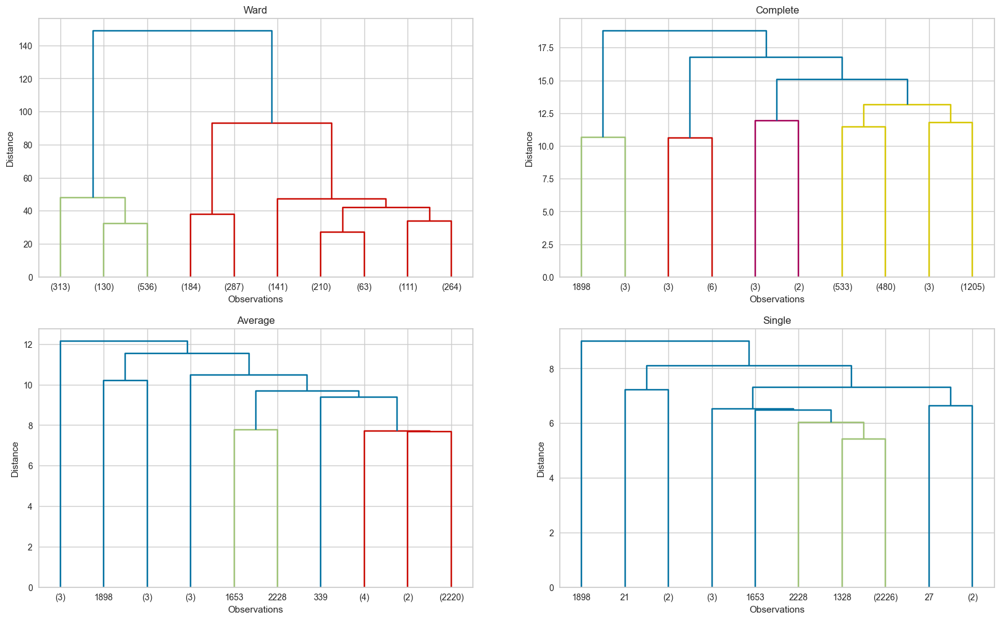

In [2922]:
plt.figure(figsize=(20,12))

plt.subplot(221)
plt.title("Ward")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_ward, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(222)
plt.title("Complete")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_complete, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(223)
plt.title("Average")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_average, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(224)
plt.title("Single")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_single, leaf_font_size=10, truncate_mode='lastp', p=10);

In [2923]:
K = range(2,10)

for k in K:
    model = AgglomerativeClustering(n_clusters = k)
    model.fit_predict(X4)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(X4, model.labels_)}')

Silhouette Score for 2 clusters: 0.28034309739152524
Silhouette Score for 3 clusters: 0.2585934564202197
Silhouette Score for 4 clusters: 0.15397098762656924
Silhouette Score for 5 clusters: 0.1528948607387168
Silhouette Score for 6 clusters: 0.14778365243538644
Silhouette Score for 7 clusters: 0.1416103369589327
Silhouette Score for 8 clusters: 0.1440783772284333
Silhouette Score for 9 clusters: 0.1486139136824825


In [2924]:
final_model = AgglomerativeClustering(n_clusters=4,
                                      metric="euclidean",
                                      linkage="ward")
clusters = final_model.fit_predict(X4)

In [994]:
X4["clusters"] = clusters

NameError: name 'X4' is not defined

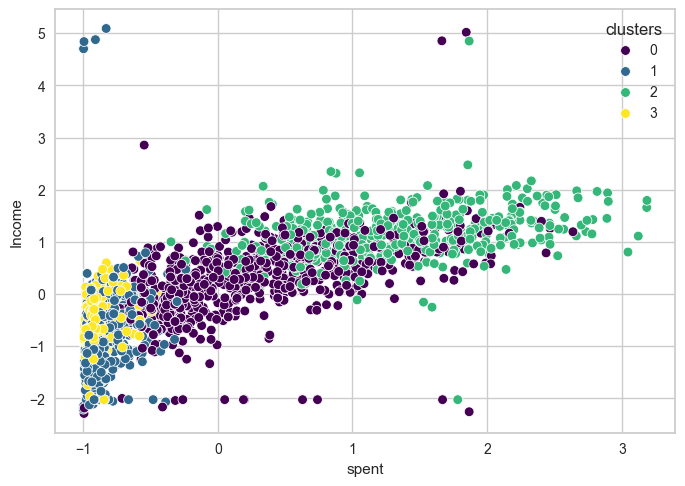

In [2926]:
sns.scatterplot(data=X4, x="spent", y="Income", hue="clusters", palette = 'viridis');

In [2927]:
X4[(X4.clusters == 3) | (X4.clusters == 1)].T

,1,3,7,8,9,10,11,14,16,19,...,2215,2216,2218,2222,2223,2229,2230,2232,2233,2238
Income,-0.24,-1.15,-0.83,-0.98,-2.11,-2.02,-2.02,-1.57,-0.45,-0.82,...,-0.68,-1.06,-1.32,-2.02,-0.83,-1.25,-1.86,-1.14,-0.79,0.06
MntWines,-0.87,-0.87,-0.68,-0.86,-0.82,-0.89,-0.89,-0.89,-0.75,-0.89,...,-0.89,-0.85,-0.89,-0.90,-0.84,-0.89,-0.83,-0.89,-0.89,-0.65
MntFruits,-0.64,-0.56,-0.41,-0.66,-0.66,-0.54,-0.26,-0.31,-0.54,-0.23,...,-0.61,-0.59,-0.64,-0.46,-0.36,-0.61,-0.59,-0.64,-0.59,-0.59
MntMeatProducts,-0.71,-0.65,-0.49,-0.63,-0.71,-0.71,-0.69,-0.66,-0.66,-0.66,...,-0.72,-0.66,-0.70,-0.69,-0.69,-0.70,-0.62,-0.71,-0.71,-0.47
MntFishProducts,-0.65,-0.50,-0.63,-0.63,-0.67,-0.69,-0.49,-0.58,-0.65,-0.14,...,-0.69,-0.63,-0.69,-0.63,-0.69,-0.32,-0.56,-0.63,-0.58,-0.65
MntSweetProducts,-0.63,-0.58,-0.63,-0.58,-0.63,-0.61,-0.63,-0.63,-0.34,-0.07,...,-0.66,-0.58,-0.66,-0.46,-0.58,-0.66,-0.63,-0.56,-0.61,-0.63
MntGoldProds,-0.73,-0.75,-0.40,-0.81,-0.59,-0.83,-0.54,-0.75,-0.77,-0.10,...,-0.75,-0.73,-0.83,-0.44,-0.79,-0.52,-0.40,-0.79,-0.67,-0.44
NumDealsPurchases,-0.17,-0.17,-0.17,-0.69,-0.69,-0.69,-0.69,-0.69,0.35,-0.17,...,-0.69,-0.17,-0.69,0.87,0.35,-0.17,0.35,-0.69,-0.69,0.35
NumWebPurchases,-1.11,-0.75,-0.03,-0.39,-1.11,-1.11,-0.75,-1.11,-0.39,-0.75,...,-1.11,-0.75,-1.11,-0.39,-0.75,-0.75,-0.39,-1.47,-1.11,-0.39
NumStorePurchases,-1.17,-0.55,-0.55,-1.17,-1.78,-1.17,-0.86,-0.86,-0.86,-0.86,...,-1.17,-0.86,-1.17,-1.17,-0.55,-1.17,-1.17,-0.86,-1.17,-0.55


In [2928]:
X4[X4.clusters == 3].corr()

,Income,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumStorePurchases,NumWebVisitsMonth,siblings,family_s,spent,age,NumTotalPurchases,clusters
Income,1,0.41,-0.00,0.22,-0.05,0.02,0.10,-0.16,0.07,0.20,-0.30,NaN,-0.07,0.32,-0.01,0.03,NaN
MntWines,0.41,1,0.11,0.58,0.07,0.18,0.44,0.56,0.64,0.55,0.02,NaN,-0.07,0.88,-0.01,0.74,NaN
MntFruits,-0.00,0.11,1,0.43,0.69,0.54,0.30,0.30,0.33,0.34,-0.08,NaN,0.02,0.40,-0.00,0.38,NaN
MntMeatProducts,0.22,0.58,0.43,1,0.42,0.45,0.60,0.56,0.69,0.46,0.13,NaN,-0.11,0.84,-0.10,0.72,NaN
MntFishProducts,-0.05,0.07,0.69,0.42,1,0.48,0.38,0.33,0.35,0.22,-0.00,NaN,-0.01,0.40,-0.05,0.38,NaN
MntSweetProducts,0.02,0.18,0.54,0.45,0.48,1,0.32,0.31,0.29,0.38,-0.13,NaN,-0.00,0.44,-0.01,0.40,NaN
MntGoldProds,0.10,0.44,0.30,0.60,0.38,0.32,1,0.47,0.50,0.07,0.07,NaN,-0.15,0.72,-0.05,0.55,NaN
NumDealsPurchases,-0.16,0.56,0.30,0.56,0.33,0.31,0.47,1,0.74,0.52,0.14,NaN,-0.10,0.66,-0.04,0.94,NaN
NumWebPurchases,0.07,0.64,0.33,0.69,0.35,0.29,0.50,0.74,1,0.37,0.30,NaN,-0.06,0.75,-0.07,0.84,NaN
NumStorePurchases,0.20,0.55,0.34,0.46,0.22,0.38,0.07,0.52,0.37,1,-0.29,NaN,0.06,0.53,-0.00,0.64,NaN


In [2929]:
X4[X4.clusters == 1].corr()

,Income,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumStorePurchases,NumWebVisitsMonth,siblings,family_s,spent,age,NumTotalPurchases,clusters
Income,1,0.40,0.00,0.23,-0.04,0.01,-0.02,-0.20,0.11,0.24,-0.49,0.05,0.03,0.32,0.31,0.11,NaN
MntWines,0.40,1,0.05,0.55,0.06,0.03,0.23,0.27,0.67,0.65,-0.09,-0.01,-0.06,0.86,0.30,0.72,NaN
MntFruits,0.00,0.05,1,0.35,0.40,0.59,0.34,0.15,0.25,0.33,-0.07,-0.27,-0.19,0.38,0.05,0.34,NaN
MntMeatProducts,0.23,0.55,0.35,1,0.39,0.39,0.29,0.37,0.66,0.60,-0.02,-0.08,-0.08,0.80,0.07,0.74,NaN
MntFishProducts,-0.04,0.06,0.40,0.39,1,0.45,0.32,0.17,0.24,0.29,-0.08,-0.21,-0.13,0.39,-0.02,0.34,NaN
MntSweetProducts,0.01,0.03,0.59,0.39,0.45,1,0.32,0.19,0.25,0.30,-0.11,-0.23,-0.13,0.38,0.02,0.37,NaN
MntGoldProds,-0.02,0.23,0.34,0.29,0.32,0.32,1,0.18,0.31,0.09,0.11,-0.15,-0.11,0.53,0.04,0.33,NaN
NumDealsPurchases,-0.20,0.27,0.15,0.37,0.17,0.19,0.18,1,0.63,0.27,0.19,0.29,0.11,0.36,-0.16,0.74,NaN
NumWebPurchases,0.11,0.67,0.25,0.66,0.24,0.25,0.31,0.63,1,0.46,0.19,0.06,-0.02,0.75,0.05,0.87,NaN
NumStorePurchases,0.24,0.65,0.33,0.60,0.29,0.30,0.09,0.27,0.46,1,-0.37,-0.12,-0.09,0.69,0.19,0.71,NaN


In [2930]:
X2[X2.clusters == 0].corr()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases,predicted_clusters,response,clusters
Income,1,-0.12,0.40,-0.08,0.62,0.27,0.62,0.23,0.31,0.30,...,0.06,0.16,0.11,0.27,0.66,0.24,0.60,0.41,0.34,NaN
Kidhome,-0.12,1,-0.24,0.06,-0.27,-0.18,-0.18,-0.21,-0.19,-0.18,...,-0.12,0.74,0.58,-0.36,-0.28,-0.09,-0.15,-0.03,-0.06,NaN
Teenhome,0.40,-0.24,1,-0.18,0.52,0.10,0.34,0.06,0.12,0.25,...,0.22,0.47,0.25,0.42,0.49,0.24,0.48,0.74,0.57,NaN
Recency,-0.08,0.06,-0.18,1,-0.10,-0.01,-0.06,-0.00,0.03,-0.07,...,-0.00,-0.07,-0.04,-0.05,-0.09,-0.12,-0.09,-0.18,-0.30,NaN
MntWines,0.62,-0.27,0.52,-0.10,1,0.25,0.68,0.20,0.26,0.38,...,0.25,0.11,0.07,0.33,0.93,0.28,0.78,0.47,0.44,NaN
MntFruits,0.27,-0.18,0.10,-0.01,0.25,1,0.44,0.43,0.49,0.38,...,0.18,-0.10,-0.07,0.09,0.45,0.03,0.44,0.19,0.12,NaN
MntMeatProducts,0.62,-0.18,0.34,-0.06,0.68,0.44,1,0.41,0.55,0.46,...,0.27,0.08,0.07,0.20,0.85,0.22,0.79,0.41,0.35,NaN
MntFishProducts,0.23,-0.21,0.06,-0.00,0.20,0.43,0.41,1,0.59,0.35,...,0.21,-0.14,-0.07,0.11,0.42,-0.03,0.38,0.12,0.03,NaN
MntSweetProducts,0.31,-0.19,0.12,0.03,0.26,0.49,0.55,0.59,1,0.36,...,0.22,-0.08,-0.03,0.09,0.49,0.02,0.44,0.18,0.16,NaN
MntGoldProds,0.30,-0.18,0.25,-0.07,0.38,0.38,0.46,0.35,0.36,1,...,0.25,0.01,0.01,0.13,0.58,0.23,0.52,0.31,0.29,NaN


In [2931]:
X2[X2.clusters == 1].corr()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases,predicted_clusters,response,clusters
Income,1,-0.07,0.10,-0.05,0.19,0.03,0.33,0.03,0.14,-0.00,...,-0.12,0.04,0.06,-0.02,0.36,0.23,0.20,-0.19,0.11,NaN
Kidhome,-0.07,1,-0.03,0.04,0.14,0.05,-0.02,-0.02,-0.06,-0.03,...,0.08,0.59,0.31,-0.09,0.09,0.03,0.10,-0.03,-0.01,NaN
Teenhome,0.10,-0.03,1,0.08,0.09,-0.08,-0.05,-0.02,-0.05,-0.01,...,0.06,0.79,0.41,0.04,0.02,0.15,0.16,-0.10,0.14,NaN
Recency,-0.05,0.04,0.08,1,-0.00,-0.09,0.02,0.00,0.01,0.03,...,0.04,0.09,-0.02,0.01,0.00,-0.01,0.01,0.12,-0.24,NaN
MntWines,0.19,0.14,0.09,-0.00,1,-0.07,-0.00,-0.14,-0.07,-0.07,...,0.14,0.16,0.11,-0.02,0.72,0.52,0.14,-0.54,0.29,NaN
MntFruits,0.03,0.05,-0.08,-0.09,-0.07,1,0.05,0.24,0.26,0.19,...,-0.02,-0.03,-0.02,-0.06,0.18,-0.09,-0.05,0.05,-0.01,NaN
MntMeatProducts,0.33,-0.02,-0.05,0.02,-0.00,0.05,1,0.06,0.05,-0.06,...,0.11,-0.05,0.01,-0.10,0.61,-0.01,0.13,-0.07,0.07,NaN
MntFishProducts,0.03,-0.02,-0.02,0.00,-0.14,0.24,0.06,1,0.19,0.22,...,0.05,-0.03,-0.01,0.04,0.16,-0.08,-0.02,0.11,-0.04,NaN
MntSweetProducts,0.14,-0.06,-0.05,0.01,-0.07,0.26,0.05,0.19,1,0.02,...,0.01,-0.07,-0.07,-0.03,0.15,0.03,0.05,-0.05,-0.00,NaN
MntGoldProds,-0.00,-0.03,-0.01,0.03,-0.07,0.19,-0.06,0.22,0.02,1,...,0.04,-0.03,-0.03,0.02,0.10,0.06,0.00,0.02,0.06,NaN


In [2932]:
X2[X2.clusters == 2].corr()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases,predicted_clusters,response,clusters
Income,1,0.00,-0.06,-0.04,0.37,0.27,0.47,0.27,0.27,-0.07,...,-0.17,-0.04,0.00,-0.04,0.51,0.05,0.16,0.12,0.01,NaN
Kidhome,0.00,1,-0.24,-0.00,-0.06,-0.05,-0.01,-0.01,-0.03,-0.04,...,0.03,0.64,0.46,-0.16,-0.06,0.01,0.15,0.06,0.05,NaN
Teenhome,-0.06,-0.24,1,0.10,0.03,-0.07,-0.07,-0.19,-0.20,-0.08,...,-0.04,0.54,0.35,0.20,-0.07,0.07,-0.04,-0.08,0.09,NaN
Recency,-0.04,-0.00,0.10,1,0.05,0.02,0.00,-0.07,-0.00,0.03,...,0.03,0.06,0.07,0.01,0.04,0.03,-0.00,0.03,-0.03,NaN
MntWines,0.37,-0.06,0.03,0.05,1,-0.12,0.23,-0.05,-0.07,0.04,...,0.21,-0.04,-0.04,0.05,0.79,0.39,0.35,-0.20,0.18,NaN
MntFruits,0.27,-0.05,-0.07,0.02,-0.12,1,0.43,0.50,0.44,0.12,...,0.10,-0.10,-0.07,-0.12,0.31,-0.20,0.21,0.33,-0.05,NaN
MntMeatProducts,0.47,-0.01,-0.07,0.00,0.23,0.43,1,0.44,0.45,0.16,...,0.12,-0.09,-0.06,-0.11,0.69,-0.13,0.33,0.13,-0.06,NaN
MntFishProducts,0.27,-0.01,-0.19,-0.07,-0.05,0.50,0.44,1,0.52,0.17,...,0.05,-0.15,-0.10,-0.20,0.40,-0.15,0.19,0.31,-0.05,NaN
MntSweetProducts,0.27,-0.03,-0.20,-0.00,-0.07,0.44,0.45,0.52,1,0.24,...,0.07,-0.19,-0.11,-0.18,0.39,-0.16,0.18,0.31,-0.04,NaN
MntGoldProds,-0.07,-0.04,-0.08,0.03,0.04,0.12,0.16,0.17,0.24,1,...,0.16,-0.09,-0.10,-0.12,0.31,-0.07,0.15,0.01,0.06,NaN


In [2933]:
X2[X2.clusters == 3].corr()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,dt_days,siblings,family_s,age,spent,total_acceptedcmp,NumTotalPurchases,predicted_clusters,response,clusters
Income,1,-0.22,-0.08,-0.03,0.32,0.16,0.24,0.12,0.18,0.08,...,-0.14,-0.29,-0.22,-0.01,0.31,-0.03,0.06,-0.44,NaN,NaN
Kidhome,-0.22,1,-0.13,0.03,-0.28,-0.11,-0.12,-0.11,-0.14,-0.09,...,0.10,0.86,0.57,-0.15,-0.25,0.04,-0.05,0.11,NaN,NaN
Teenhome,-0.08,-0.13,1,-0.00,0.09,-0.00,0.08,-0.06,0.02,0.01,...,0.07,0.13,0.05,0.02,0.07,0.06,0.10,0.24,NaN,NaN
Recency,-0.03,0.03,-0.00,1,-0.01,0.08,0.06,0.04,0.05,0.09,...,0.08,0.01,-0.01,0.02,0.03,-0.02,0.06,-0.09,NaN,NaN
MntWines,0.32,-0.28,0.09,-0.01,1,0.21,0.61,0.18,0.24,0.38,...,0.09,-0.25,-0.13,-0.01,0.90,0.01,0.81,0.03,NaN,NaN
MntFruits,0.16,-0.11,-0.00,0.08,0.21,1,0.53,0.80,0.48,0.36,...,0.06,-0.09,-0.03,-0.03,0.50,-0.10,0.39,0.02,NaN,NaN
MntMeatProducts,0.24,-0.12,0.08,0.06,0.61,0.53,1,0.53,0.46,0.48,...,0.13,-0.11,-0.04,-0.07,0.84,-0.08,0.76,0.04,NaN,NaN
MntFishProducts,0.12,-0.11,-0.06,0.04,0.18,0.80,0.53,1,0.52,0.38,...,0.05,-0.13,-0.05,-0.02,0.50,-0.09,0.39,0.04,NaN,NaN
MntSweetProducts,0.18,-0.14,0.02,0.05,0.24,0.48,0.46,0.52,1,0.24,...,-0.00,-0.13,-0.11,-0.04,0.46,-0.09,0.40,0.02,NaN,NaN
MntGoldProds,0.08,-0.09,0.01,0.09,0.38,0.36,0.48,0.38,0.24,1,...,0.17,-0.09,-0.05,-0.02,0.60,0.11,0.48,0.05,NaN,NaN


In [997]:
clus_pred = X1.groupby("clusters").mean().T
clus_pred

clusters,0,1,2,3,4
Income,-0.77,1.13,0.42,0.03,-0.61
Kidhome,0.24,-0.79,-0.64,1.09,1.26
Teenhome,-0.41,-0.90,0.63,0.90,0.91
Recency,-0.03,0.03,0.00,-0.19,0.14
MntWines,-0.72,0.90,0.68,-0.02,-0.80
MntFruits,-0.49,0.97,0.24,-0.28,-0.60
MntMeatProducts,-0.61,1.44,0.04,-0.26,-0.67
MntFishProducts,-0.52,1.02,0.27,-0.31,-0.62
MntSweetProducts,-0.50,0.91,0.29,-0.22,-0.60
MntGoldProds,-0.49,0.56,0.55,0.04,-0.65


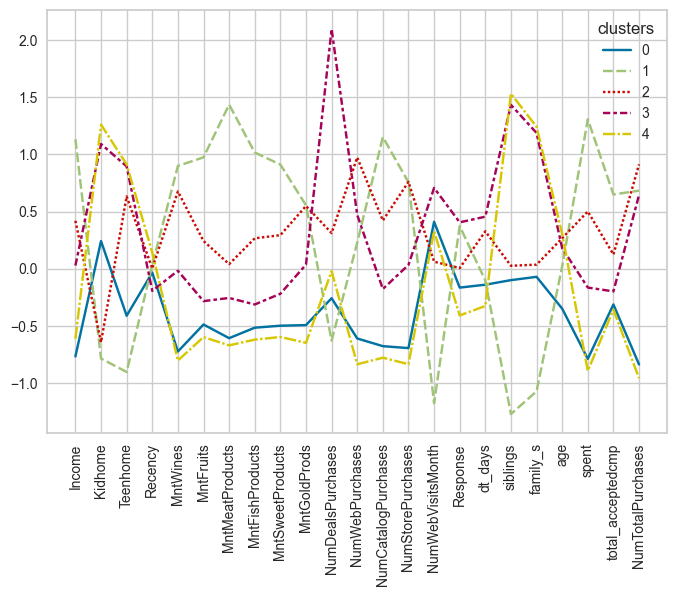

In [998]:
sns.lineplot(data=clus_pred)
plt.xticks(rotation=90)

plt.show()

In [999]:
X1.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Response', 'dt_days', 'siblings', 'family_s', 'age', 'spent',
       'total_acceptedcmp', 'NumTotalPurchases', 'clusters'],
      dtype='object')

In [1019]:
X5 = X[['Income', 'Teenhome', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'NumDealsPurchases', 'NumCatalogPurchases','NumWebPurchases',  'siblings', 'spent', 'age', 'total_acceptedcmp', 'NumTotalPurchases']]
X5

,Income,Teenhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,NumDealsPurchases,NumCatalogPurchases,NumWebPurchases,siblings,spent,age,total_acceptedcmp,NumTotalPurchases
0,0.30,-0.93,0.98,1.55,1.68,2.46,1.48,0.35,2.51,1.41,-1.32,1.68,0.98,-0.47,1.32
1,-0.24,0.91,-0.87,-0.64,-0.71,-0.65,-0.63,-0.17,-0.57,-1.11,1.53,-0.96,1.24,-0.47,-1.15
2,0.92,-0.93,0.36,0.57,-0.18,1.34,-0.15,-0.69,-0.23,1.41,-1.32,0.28,0.32,-0.47,0.80
3,-1.15,-0.93,-0.87,-0.56,-0.65,-0.50,-0.58,-0.17,-0.91,-0.75,0.10,-0.92,-1.27,-0.47,-0.89
4,0.31,-0.93,-0.39,0.42,-0.22,0.15,-0.00,1.39,0.12,0.33,0.10,-0.31,-1.02,-0.47,0.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,0.44,0.91,1.20,0.42,0.07,0.08,2.20,-0.17,0.12,1.77,0.10,1.22,0.15,-0.47,0.41
2235,0.57,0.91,0.30,-0.66,-0.61,-0.69,-0.66,2.42,-0.23,1.41,1.53,-0.27,1.90,1.29,0.93
2236,0.25,-0.93,1.79,0.55,0.22,-0.10,-0.37,-0.69,0.12,-0.75,-1.32,1.05,-1.02,1.29,0.54
2237,0.81,0.91,0.37,0.09,0.21,0.78,0.07,-0.17,0.80,0.69,0.10,0.39,1.07,-0.47,1.06


In [ ]:
X5 = X[['Income', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases','NumWebPurchases', 'NumStorePurchases',  'NumWebVisitsMonth', 'siblings', 'family_s', 'spent', 'age', 'NumTotalPurchases']]
X5

In [1020]:
hopkins(X5, 1)

0.8886906096666678

In [1021]:
hc_ward = linkage(y = X5, method = "ward")
hc_complete = linkage(X5, "complete")
hc_average = linkage(X5, "average")
hc_single = linkage(X5, "single")

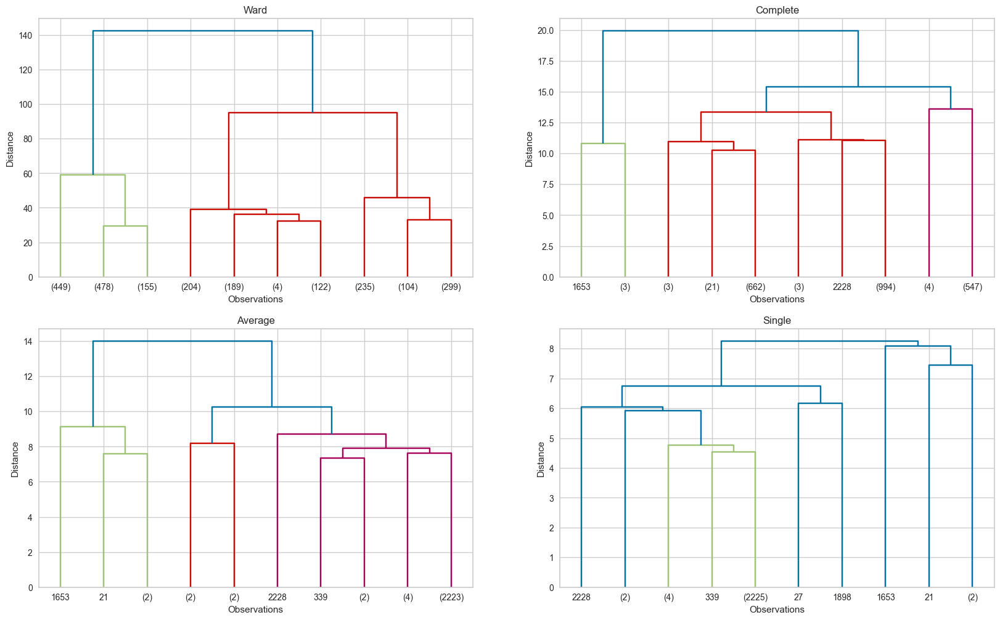

In [1022]:
plt.figure(figsize=(20,12))

plt.subplot(221)
plt.title("Ward")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_ward, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(222)
plt.title("Complete")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_complete, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(223)
plt.title("Average")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_average, leaf_font_size=10, truncate_mode='lastp', p=10)

plt.subplot(224)
plt.title("Single")
plt.xlabel("Observations")
plt.ylabel("Distance")
dendrogram(hc_single, leaf_font_size=10, truncate_mode='lastp', p=10);

In [1023]:
K = range(2,10)

for k in K:
    model = AgglomerativeClustering(n_clusters = k)
    model.fit_predict(X5)
    print(f'Silhouette Score for {k} clusters: {silhouette_score(X5, model.labels_)}')

Silhouette Score for 2 clusters: 0.28597655216840145
Silhouette Score for 3 clusters: 0.2804364222776206
Silhouette Score for 4 clusters: 0.21845038844423387
Silhouette Score for 5 clusters: 0.20363451499120666
Silhouette Score for 6 clusters: 0.20023834996430012
Silhouette Score for 7 clusters: 0.1992197026925754
Silhouette Score for 8 clusters: 0.20239196882884442
Silhouette Score for 9 clusters: 0.20398005687591655


In [1037]:
final_model = AgglomerativeClustering(n_clusters=4,
                                      metric="euclidean",
                                      linkage="ward")
clusters = final_model.fit_predict(X5)

In [1038]:
X5["clusters"] = clusters

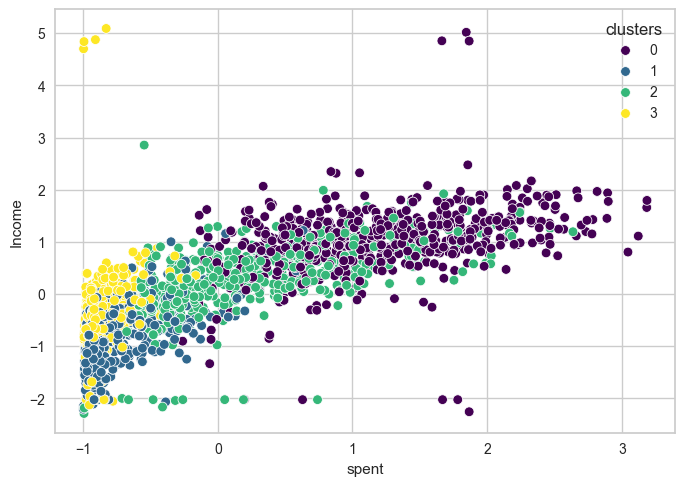

In [1039]:
sns.scatterplot(data=X5, x="spent", y="Income", hue="clusters", palette = 'viridis');

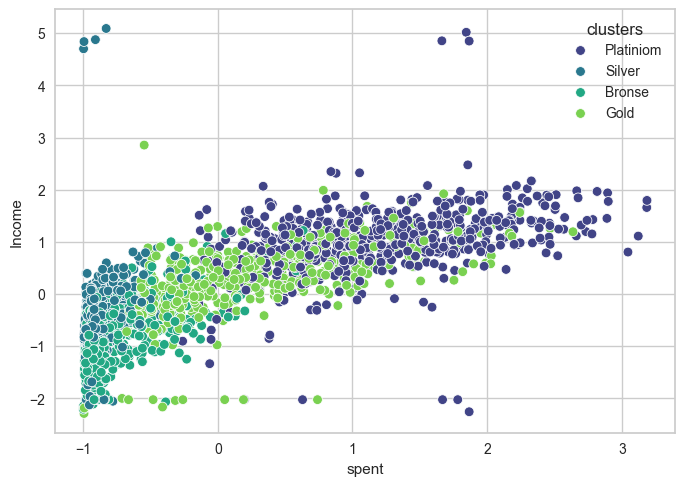

In [1050]:
sns.scatterplot(data=X5, x="spent", y="Income", hue="clusters", palette = 'viridis');

In [1049]:
X5.clusters = X5.clusters.map({1:'Bronse', 3:'Silver', 2:'Gold', 0:'Platiniom'})

## Conclusion

K_MEANS MODELLEME

Öncelikle Tercihim ilk model.

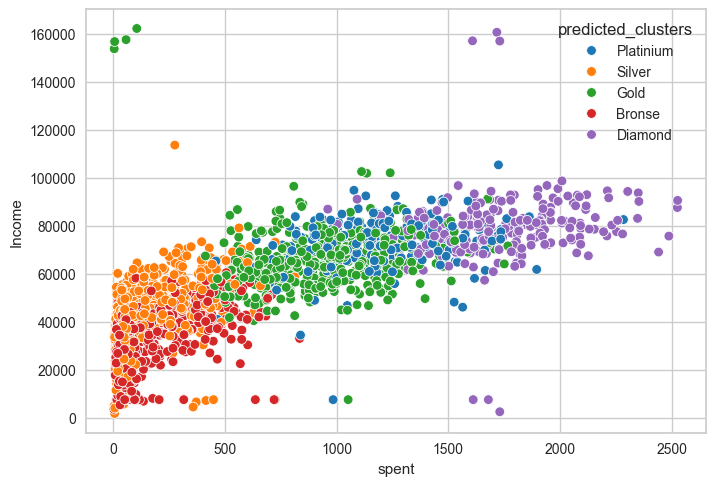

In [1046]:
sns.scatterplot(data=df3, x="spent", y="Income", hue="predicted_clusters", palette = 'tab10');

In [1064]:
df_k_1 = df.copy()

In [1068]:
df_k_1['predicted_clusters'] = df3['predicted_clusters']

In [1081]:
df.groupby([final_model3.labels_, 'Marital_Status'])['Marital_Status'].value_counts()

   Marital_Status
0  single            211
   together          387
1  single             89
   together          150
2  single            171
   together          302
3  single            239
   together          441
4  single             86
   together          163
Name: count, dtype: int64

In [1083]:
df_k_1.T

,0,1,2,3,4,5,6,7,8,9,...,2229,2230,2231,2232,2234,2235,2236,2237,2238,2239
Education,Graduation,Graduation,Graduation,Graduation,PhD,Master,Graduation,PhD,PhD,PhD,...,Graduation,Graduation,Master,Graduation,Graduation,Graduation,PhD,Graduation,Master,PhD
Marital_Status,single,single,together,together,together,together,single,together,together,together,...,together,single,single,single,together,together,together,single,together,together
Income,58138,46344,71613,26646,58293,62513,55635,33454,30351,5648,...,24434,11012,44802,26816,34421,61223,64014,56981,69245,52869
Kidhome,0,1,0,1,1,0,0,1,1,1,...,2,1,0,0,1,0,2,0,0,1
Teenhome,0,1,0,0,0,1,1,0,0,1,...,0,0,0,0,0,1,1,0,1,1
Recency,58,38,26,26,94,16,34,32,19,68,...,9,82,71,50,81,46,56,91,8,40
MntWines,635,11,426,11,173,520,235,76,14,28,...,3,24,853,5,3,709,406,908,428,84
MntFruits,88,1,49,4,43,42,65,10,0,0,...,2,3,10,1,3,43,0,48,30,3
MntMeatProducts,546,6,127,20,118,98,164,56,24,6,...,8,26,143,6,7,182,30,217,214,61
MntFishProducts,172,2,111,10,46,0,50,3,3,1,...,20,7,13,3,6,42,0,32,80,2


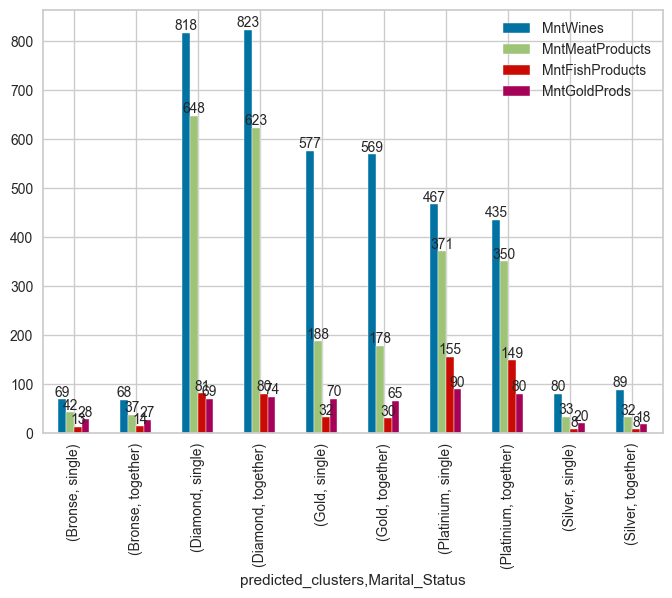

In [1122]:
ax = df_k_1.loc[:,['MntWines','MntMeatProducts', 'MntFishProducts', 'MntGoldProds', 'predicted_clusters', 'Marital_Status']].groupby(['predicted_clusters', 'Marital_Status']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=10)

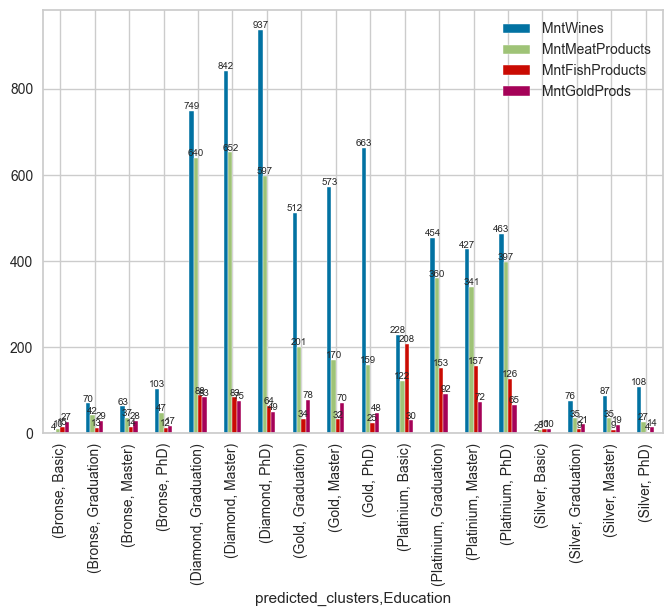

In [1125]:
ax = df_k_1.loc[:,['MntWines','MntMeatProducts', 'MntFishProducts', 'MntGoldProds', 'predicted_clusters', 'Education']].groupby(['predicted_clusters', 'Education']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

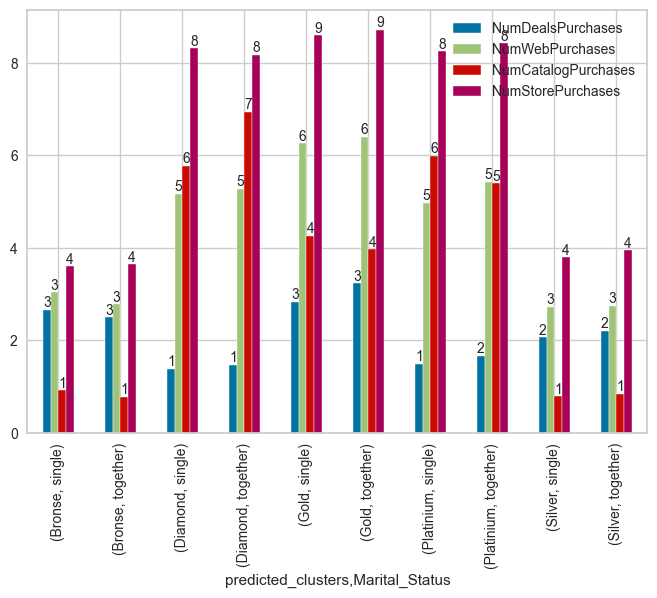

In [1151]:
ax = df_k_1.loc[:,['NumDealsPurchases','NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'predicted_clusters', 'Marital_Status']].groupby(['predicted_clusters', 'Marital_Status']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=10)

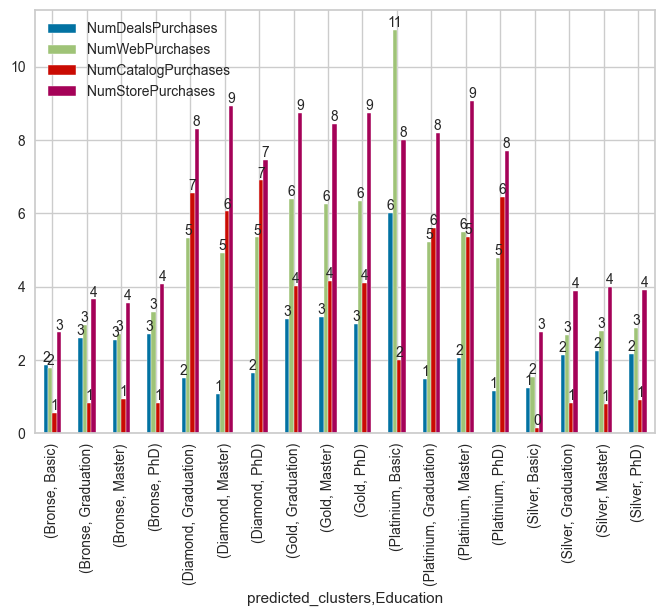

In [1152]:
ax = df_k_1.loc[:,['NumDealsPurchases','NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'predicted_clusters', 'Education']].groupby(['predicted_clusters', 'Education']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=10)

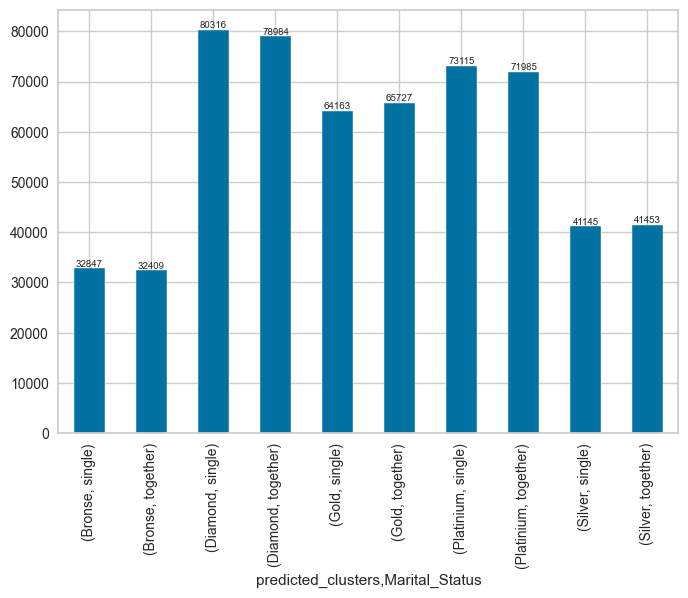

In [1153]:
ax = df_k_1.groupby(['predicted_clusters', 'Marital_Status'])['Income'].mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

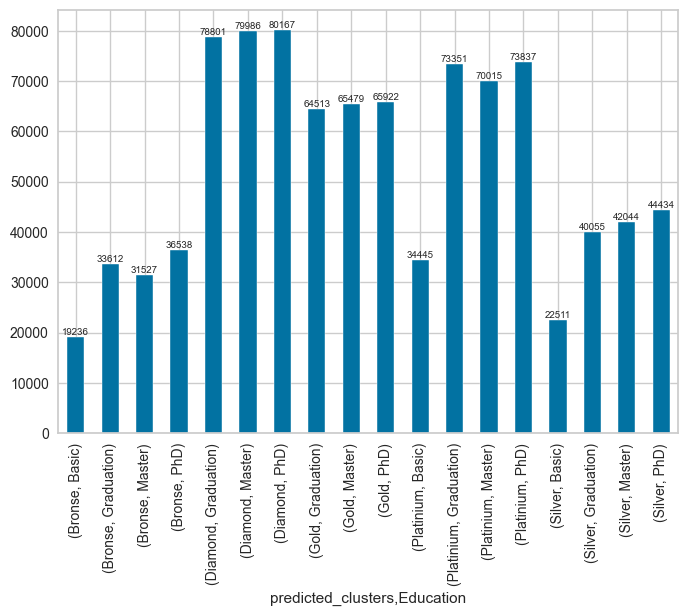

In [1154]:
ax = df_k_1.groupby(['predicted_clusters', 'Education'])['Income'].mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

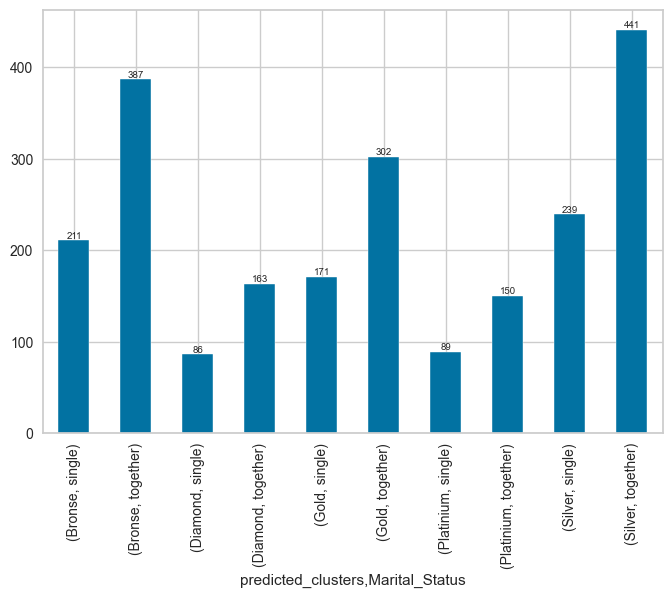

In [1129]:
ax = df_k_1.groupby(['predicted_clusters', 'Marital_Status'])['Response'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

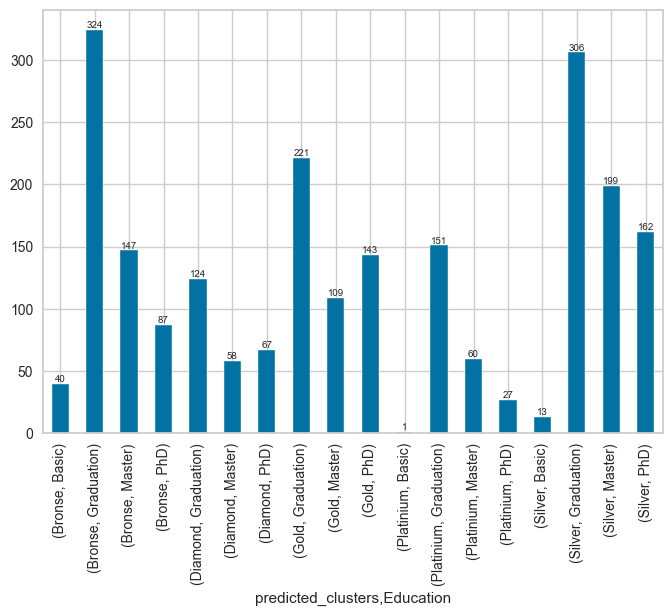

In [1130]:
ax = df_k_1.groupby(['predicted_clusters', 'Education'])['Response'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

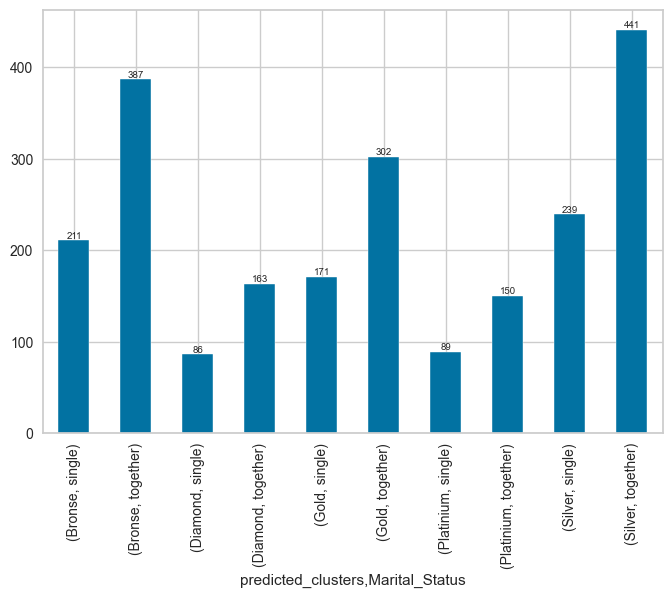

In [1132]:
ax = df_k_1.groupby(['predicted_clusters', 'Marital_Status'])['NumWebVisitsMonth'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

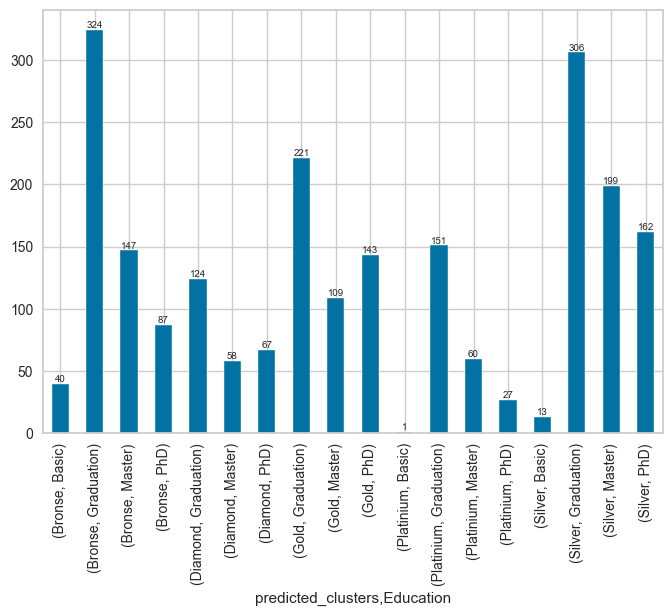

In [1133]:
ax = df_k_1.groupby(['predicted_clusters', 'Education'])['NumWebVisitsMonth'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

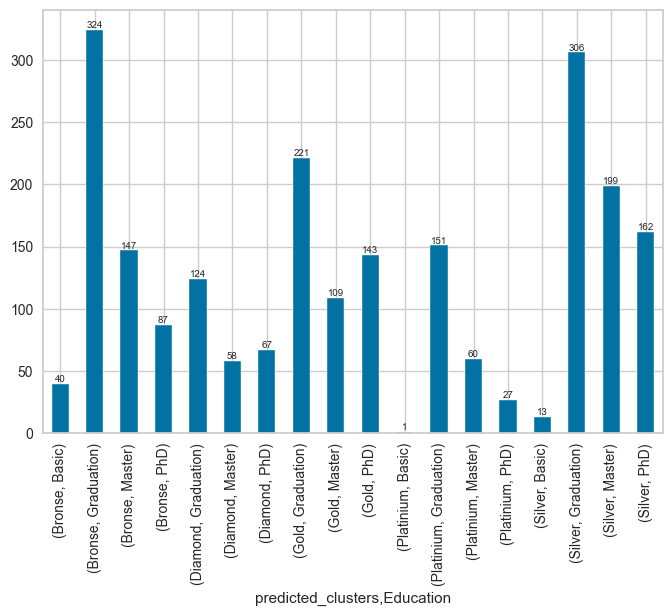

In [1138]:
ax = df_k_1.groupby(['predicted_clusters', 'Education'])['total_acceptedcmp'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

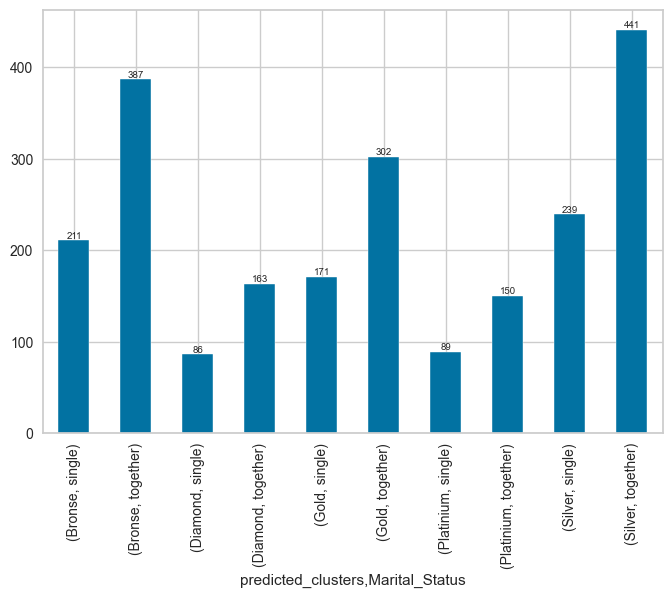

In [1140]:
ax = df_k_1.groupby(['predicted_clusters', 'Marital_Status'])['total_acceptedcmp'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

Bana göre segmentasyon değişiimini destekleyebilecek en güzel plot. 1. K-Means cluster=5

Burada Turuncu ile görünen belirli oranda yüksek gelire sahip olup daha düşük gelirliler ile aynı alışveriş oranına sahip kişileri (Bronse grup) daha üst yani Gold guruba taşımak için bu gurubun satın alma alışkanlıkları, çocuk oranları, kampanya hareketlerine temel ürünlere göre yeni kampanyalar yapılır.

Mavi ile belirtilen Platinium gurubu Diamond yani en yüksek guruba satınalma alışkanıkları göz önünde bulundurarak lüx kampanya ve avantajlar ile müşteri segmenti değiştirilebilir.


Gerekli analizler ile hangi ürünlerdeki kampanyalar katılımı arttırır ve segmentasyon değişikliği sağlar yarın bakılacak.

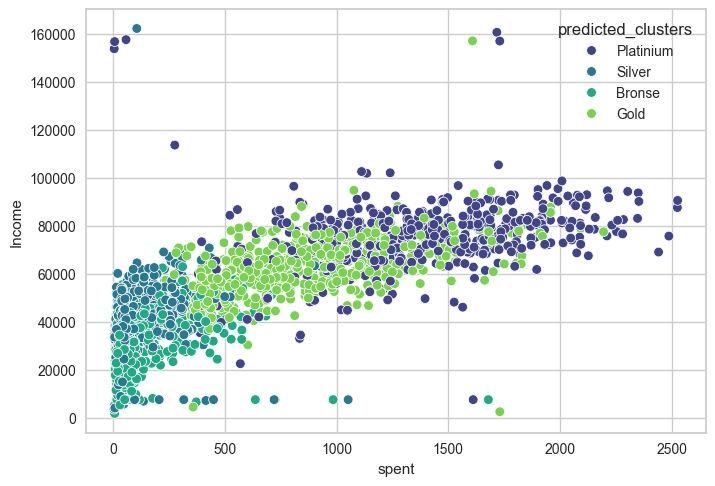

In [1047]:
sns.scatterplot(data=df4, x="spent", y="Income", hue="predicted_clusters", palette = 'viridis');

In [1141]:
df_k_2 = df.copy()

In [1142]:
df_k_2['predicted_clusters'] = df4['predicted_clusters']

In [ ]:
ax = df_k_2.groupby(['predicted_clusters', 'Marital_Status'])['Income'].mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

In [ ]:
ax = df_k_2.groupby(['predicted_clusters', 'Marital_Status'])['Education'].mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

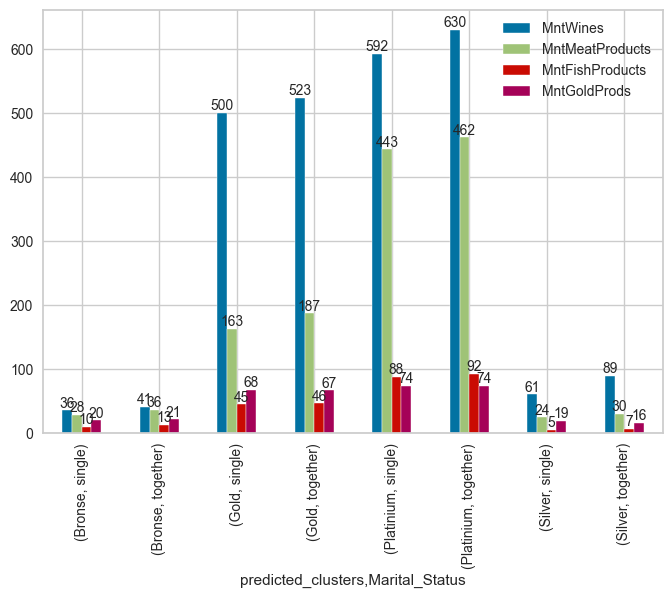

In [1143]:
ax = df_k_2.loc[:,['MntWines','MntMeatProducts', 'MntFishProducts', 'MntGoldProds', 'predicted_clusters', 'Marital_Status']].groupby(['predicted_clusters', 'Marital_Status']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=10)

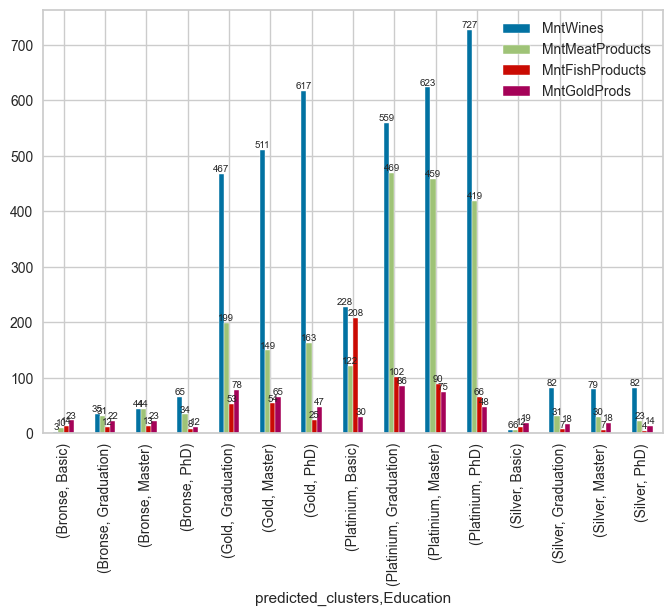

In [1144]:
ax = df_k_2.loc[:,['MntWines','MntMeatProducts', 'MntFishProducts', 'MntGoldProds', 'predicted_clusters', 'Education']].groupby(['predicted_clusters', 'Education']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

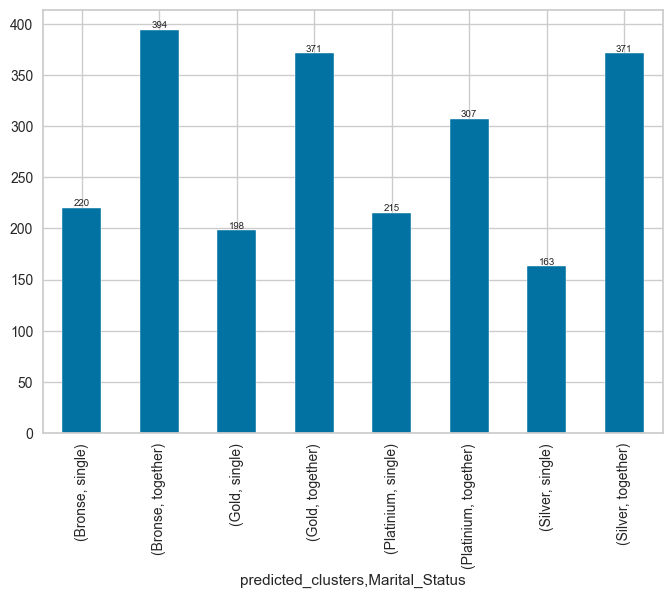

In [1145]:
ax = df_k_2.groupby(['predicted_clusters', 'Marital_Status'])['Response'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

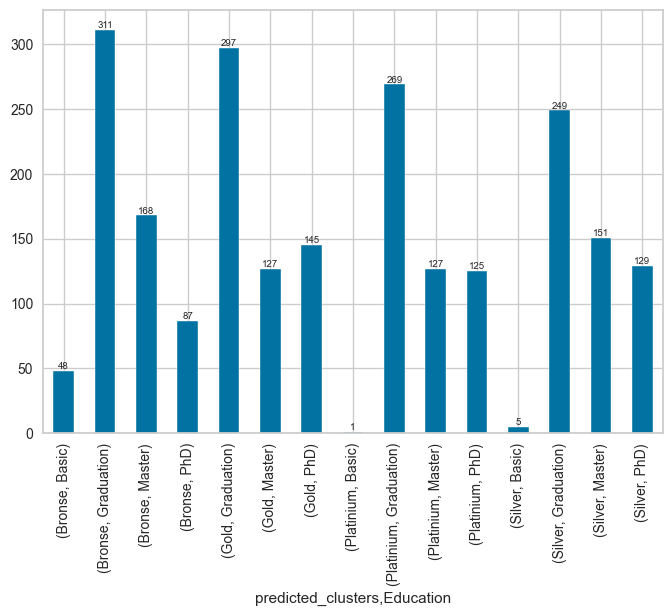

In [1146]:
ax = df_k_2.groupby(['predicted_clusters', 'Education'])['Response'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

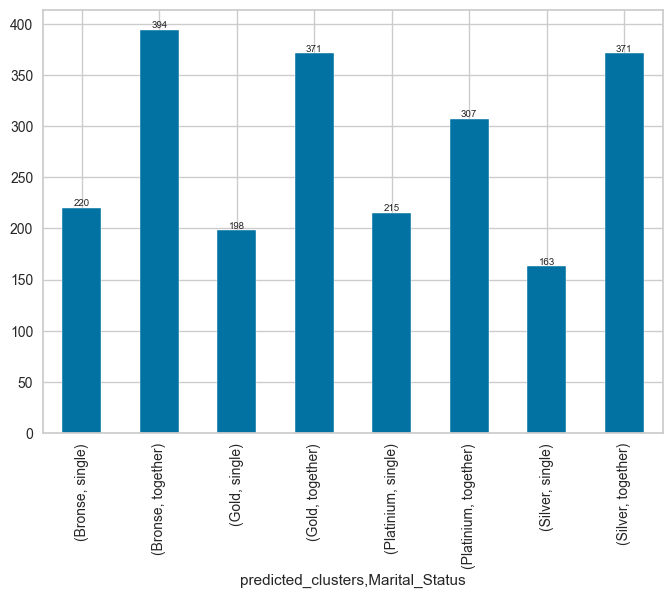

In [1147]:
ax = df_k_2.groupby(['predicted_clusters', 'Marital_Status'])['NumWebVisitsMonth'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

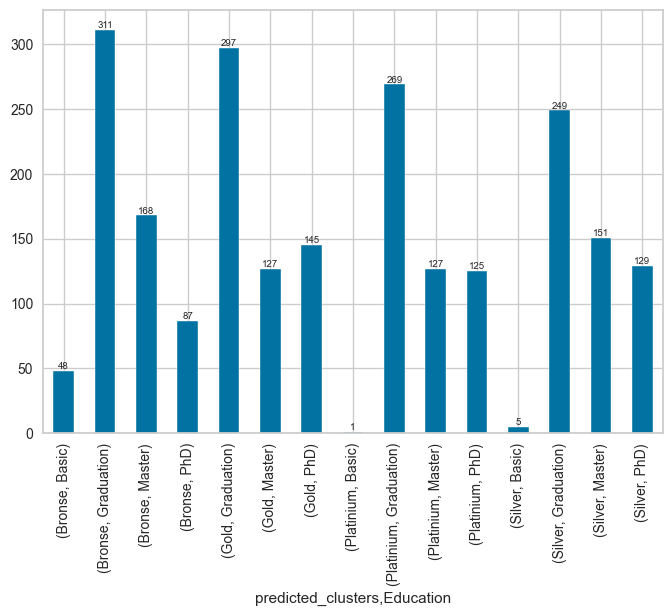

In [1148]:
ax = df_k_2.groupby(['predicted_clusters', 'Education'])['NumWebVisitsMonth'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

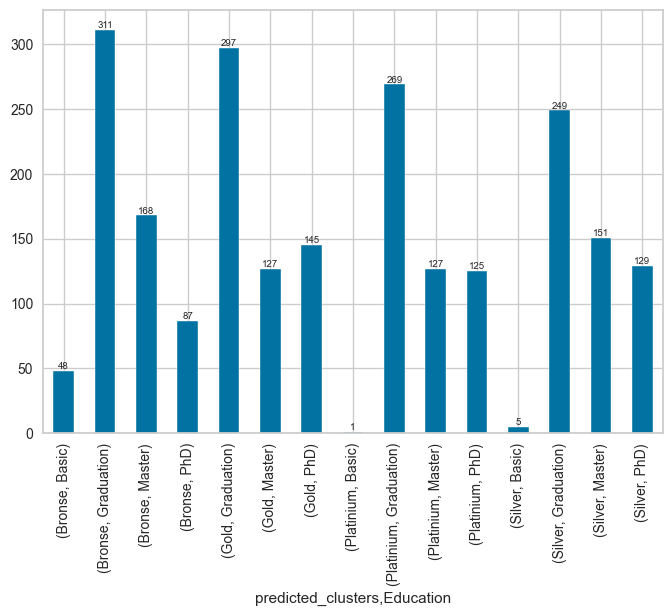

In [1149]:
ax = df_k_2.groupby(['predicted_clusters', 'Education'])['total_acceptedcmp'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

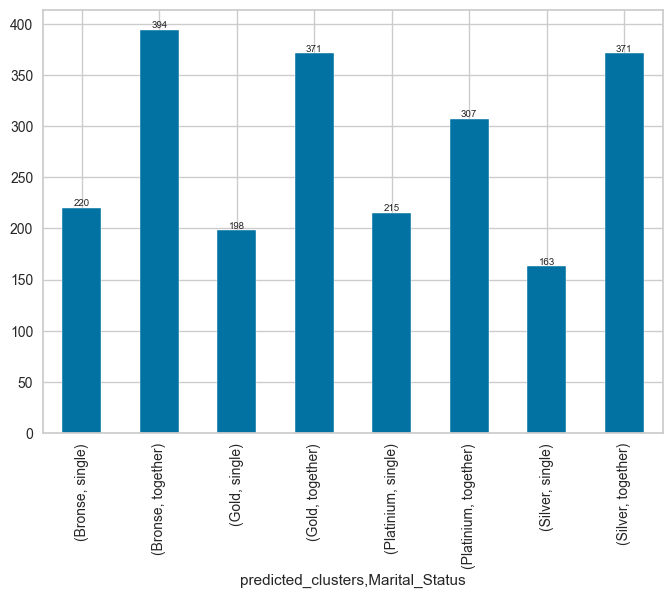

In [1150]:
ax = df_k_2.groupby(['predicted_clusters', 'Marital_Status'])['total_acceptedcmp'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

KMean cluster=4

Silver gurubundaki ziyaretçi geliri yüksek harcaması yüksek olduğundan dolayı Gold guruba alnması için gerekli kampanyalar değerlendirilebilir.

Gold guruptaki misfirler için yüksek harcama yapanlara Platinium a özel kampanyalar ile Platinium a giriş düşündürülebilir

HİERARCHİCAL MODELLEME

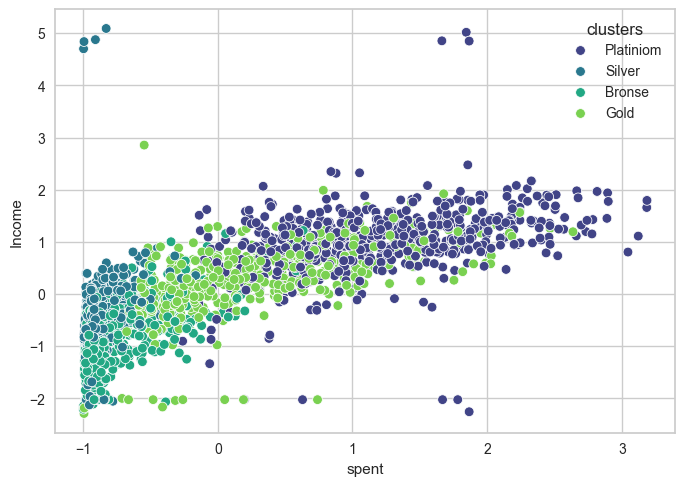

In [1051]:
sns.scatterplot(data=X5, x="spent", y="Income", hue="clusters", palette = 'viridis');

In [1155]:
df_h_1= df.copy()

In [1157]:
df_h_1['clusters'] = X5['clusters']

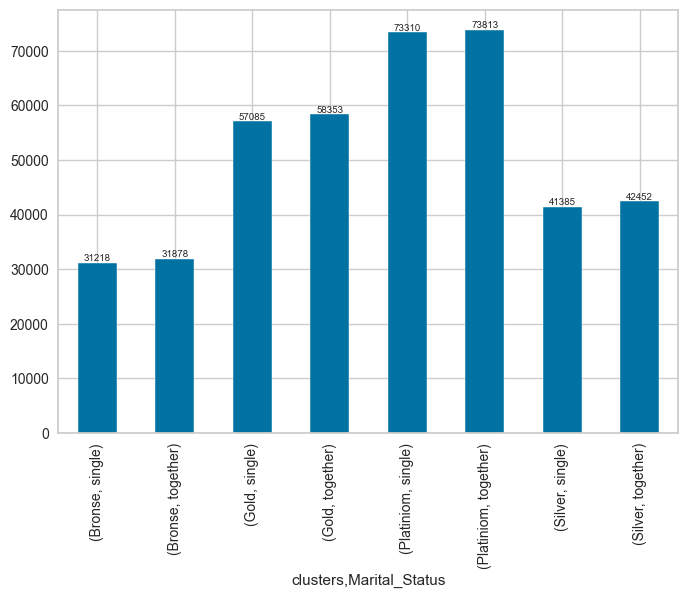

In [1158]:
ax = df_h_1.groupby(['clusters', 'Marital_Status'])['Income'].mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

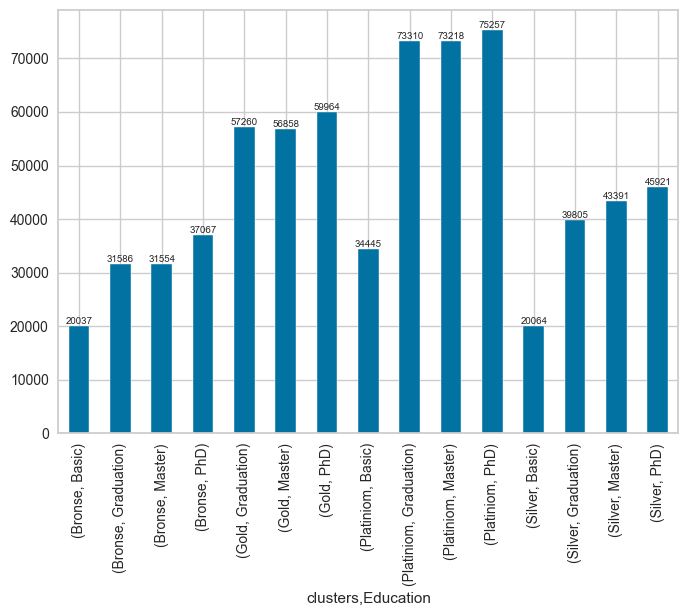

In [1159]:
ax = df_h_1.groupby(['clusters', 'Education'])['Income'].mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

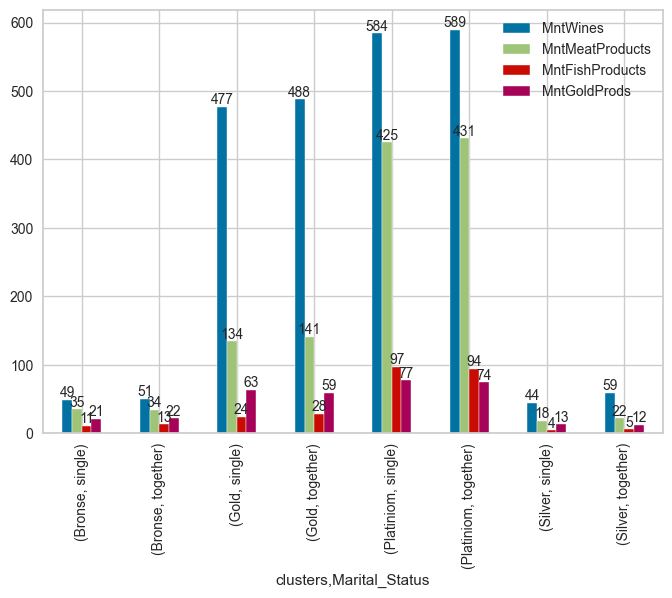

In [1160]:
ax = df_h_1.loc[:,['MntWines','MntMeatProducts', 'MntFishProducts', 'MntGoldProds', 'clusters', 'Marital_Status']].groupby(['clusters', 'Marital_Status']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=10)

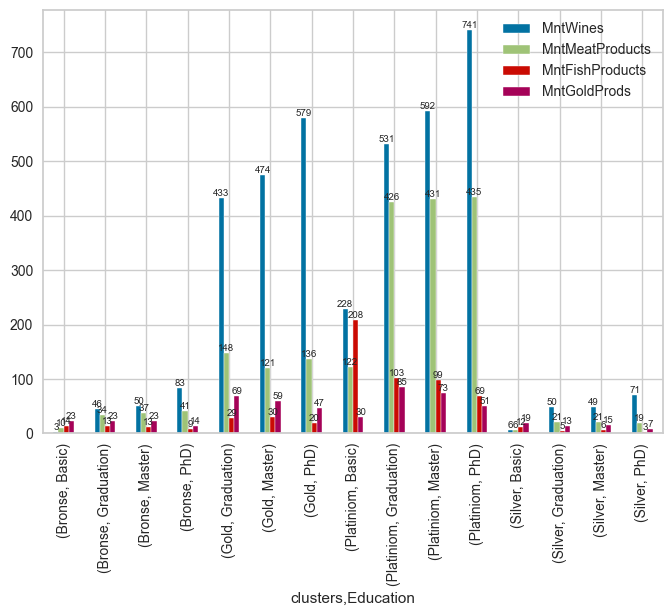

In [1161]:
ax = df_h_1.loc[:,['MntWines','MntMeatProducts', 'MntFishProducts', 'MntGoldProds', 'clusters', 'Education']].groupby(['clusters', 'Education']).mean().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

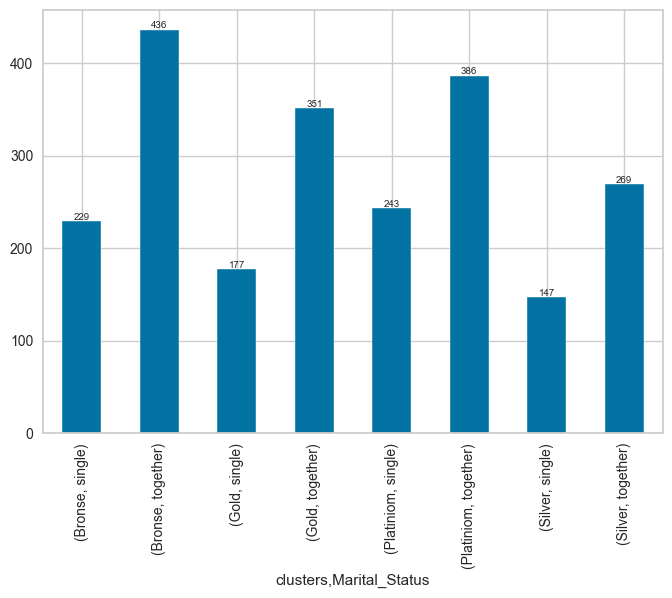

In [1162]:
ax = df_h_1.groupby(['clusters', 'Marital_Status'])['Response'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

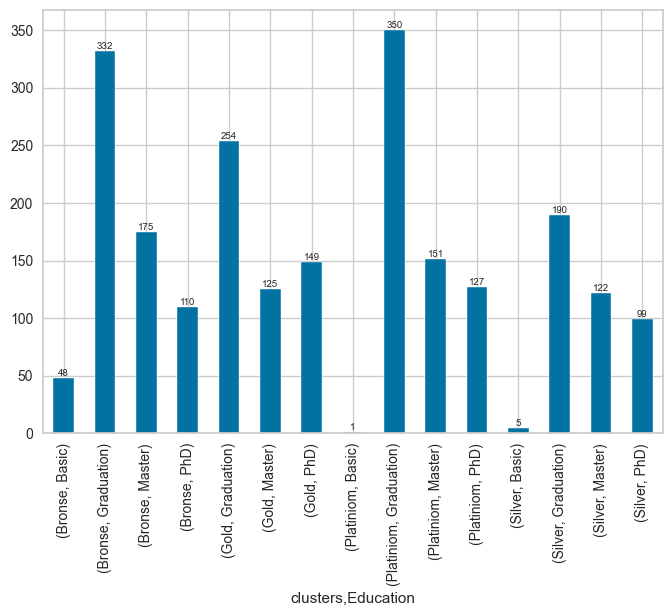

In [1163]:
ax = df_h_1.groupby(['clusters', 'Education'])['Response'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

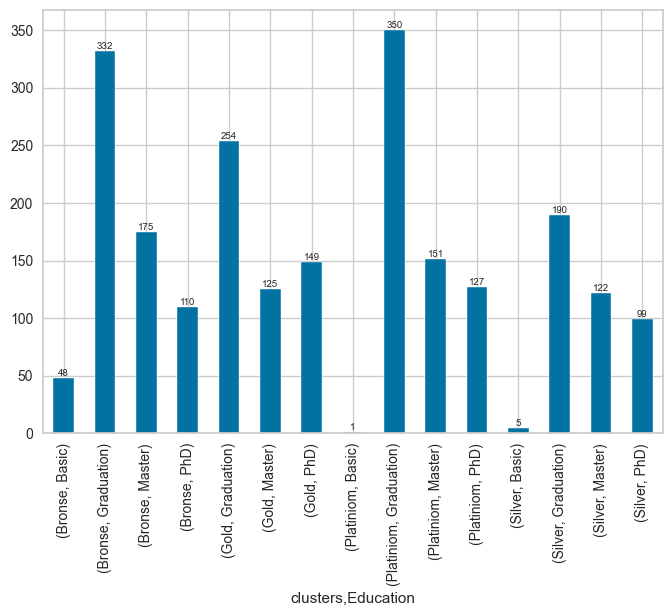

In [1164]:
ax = df_h_1.groupby(['clusters', 'Education'])['Response'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

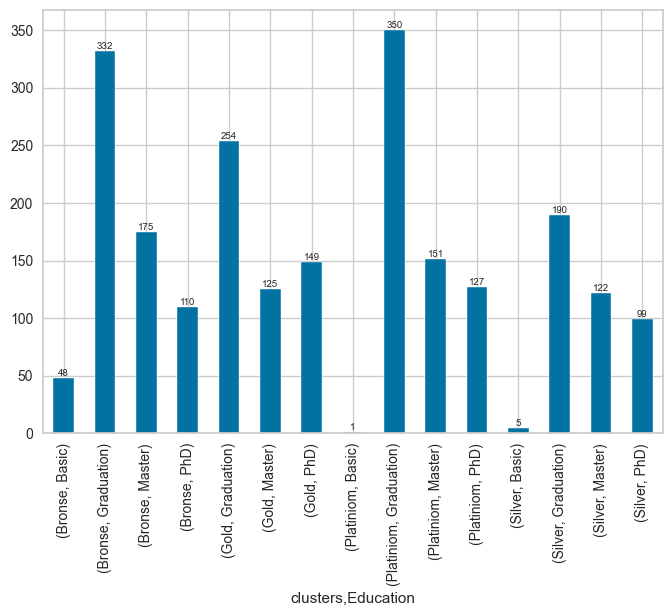

In [1165]:
ax = df_h_1.groupby(['clusters', 'Education'])['NumWebVisitsMonth'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

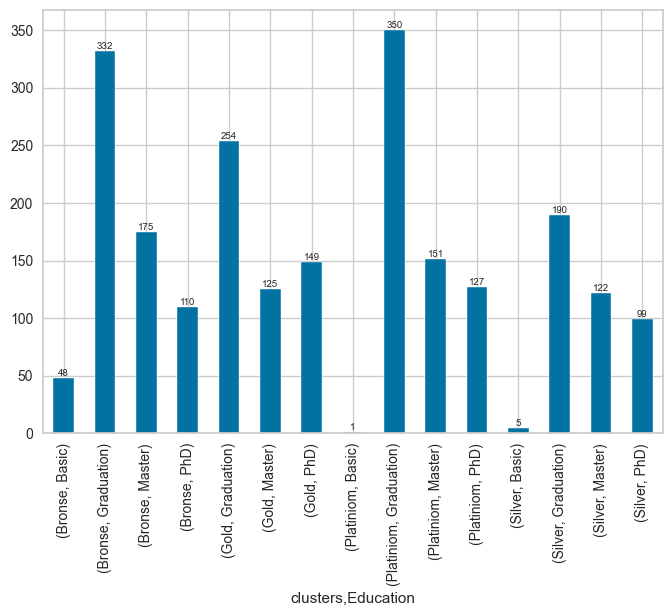

In [1166]:
ax = df_h_1.groupby(['clusters', 'Education'])['total_acceptedcmp'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

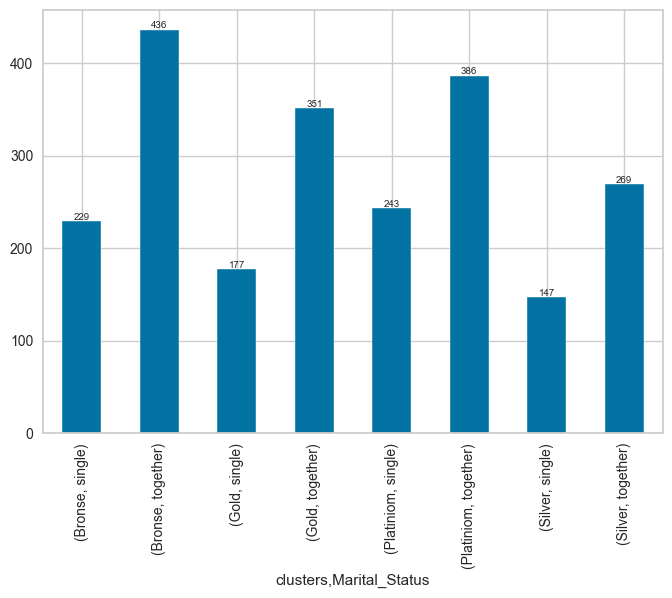

In [1167]:
ax = df_h_1.groupby(['clusters', 'Marital_Status'])['total_acceptedcmp'].count().plot(kind='bar')

for p in ax.containers:
    ax.bar_label(p, fmt='%.f', size=7)

Hierarchical claster = 4

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___